In [39]:
!pip install qutip

In [40]:
from qutip import *
import numpy as np
import pickle
import matplotlib.pyplot as plt

In [41]:
def add_wigner_noise(W, sigma=0.01, seed=None):
    if seed is not None:
        np.random.seed(seed)

    noise = np.random.normal(loc=0.0, scale=sigma, size=W.shape)
    return W + noise

In [42]:
# The reconstruction function for Wigner Overlap Tomography

# Integration function
def intergrat(W1, W2, dx,dy):
    return 2 * np.pi *np.sum(W1 * W2) * dx*dy

def rho_reconstruct(xvec,yvec,W_stat,N):
  dx,dy = xvec[1] - xvec[0],  yvec[1] - yvec[0]
  # Reconstruct using Hermitian basis
  reconstruction = np.zeros((N, N), dtype=complex)

  for m in range(N):
      print(f"{m}/{N}")
      for n in range(m, N):

          if m == n:
              # Diagonal projector: |m><m|
              G = basis(N, m) * basis(N, m).dag()
              W = wigner(G, xvec, yvec)
              v = intergrat(W, W_stat, dx,dy)
              reconstruction[m, m] = v.real
          else:
              # Symmetric (real part)
              G_plus = (basis(N, m) * basis(N, n).dag() + basis(N, n) * basis(N, m).dag()).unit()
              W_plus = wigner(G_plus, xvec, yvec)
              r = intergrat(W_plus, W_stat, dx,dy)

              # Anti-symmetric (imag part)
              G_minus = (basis(N, m) * basis(N, n).dag() - basis(N, n) * basis(N, m).dag()) * (1j)
              G_minus = G_minus.unit()
              W_minus = wigner(G_minus, xvec, yvec)
              i = intergrat(W_minus, W_stat, dx,dy)

              reconstruction[m, n] = (r - 1j * i)
              reconstruction[n, m] = (r + 1j * i)

  return reconstruction.T

def precomp(N, xvec, yvec):

    l = []
    for m in range(N):
        print(f"{m}/{N}")
        for n in range(m, N):
            if m == n:
                # Diagonal projector: |m><m|
                G = basis(N, m) * basis(N, m).dag()
                W = wigner(G, xvec, yvec)
                l.append(W)
            else:
                # Symmetric (real part)
                G_plus = (basis(N, m) * basis(N, n).dag() + basis(N, n) * basis(N, m).dag()).unit()
                W_plus = wigner(G_plus, xvec, yvec)

                # Anti-symmetric (imag part)
                G_minus = (basis(N, m) * basis(N, n).dag() - basis(N, n) * basis(N, m).dag()) * (1j)
                G_minus = G_minus.unit()
                W_minus = wigner(G_minus, xvec, yvec)
                l.append((W_plus,W_minus))
    return l




def precomp_reconstr(xvec,yvec,W_stat,N,precomp):
    dx,dy = xvec[1] - xvec[0],  yvec[1] - yvec[0]
    reconstruction = np.zeros((N, N), dtype=complex)
    j=0
    for m in range(N):
          for n in range(m, N):

              if m == n:
                  W = precomp[j]
                  # Diagonal projector: |m><m|
                  v = intergrat(W, W_stat, dx,dy)
                  reconstruction[m, m] = v.real
              else:
                  W_plus, W_minus = precomp[j]
                  # Symmetric (real part)
                  r = intergrat(W_plus, W_stat, dx,dy)

                  # Anti-symmetric (imag part)
                  i = intergrat(W_minus, W_stat, dx,dy)

                  reconstruction[m, n] = (r - 1j * i)
                  reconstruction[n, m] = (r + 1j * i)
              j += 1
    return reconstruction.T

In [43]:
def plot_density_matrix_ri(rho_hat):
    """
    Visualize the reconstructed density matrix.

    Inputs:
        rho_hat (np.ndarray): estimated density matrix (complex)
    """
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    im0 = axes[0].imshow(np.real(rho_hat), cmap='viridis')
    axes[0].set_title("Real ρᵢⱼ")
    fig.colorbar(im0, ax=axes[0])

    im1 = axes[1].imshow(np.imag(rho_hat), cmap='twilight')
    axes[1].set_title("Imag ρᵢⱼ")
    fig.colorbar(im1, ax=axes[1])

    for ax in axes:
        ax.set_xlabel("j")
        ax.set_ylabel("i")
        ax.set_xticks(np.arange(rho_hat.shape[0]))
        ax.set_yticks(np.arange(rho_hat.shape[0]))

    plt.tight_layout()
    plt.show()

0/30
1/30
2/30
3/30
4/30
5/30
6/30
7/30
8/30
9/30
10/30
11/30
12/30
13/30
14/30
15/30
16/30
17/30
18/30
19/30
20/30
21/30
22/30
23/30
24/30
25/30
26/30
27/30
28/30
29/30
Original density matrix


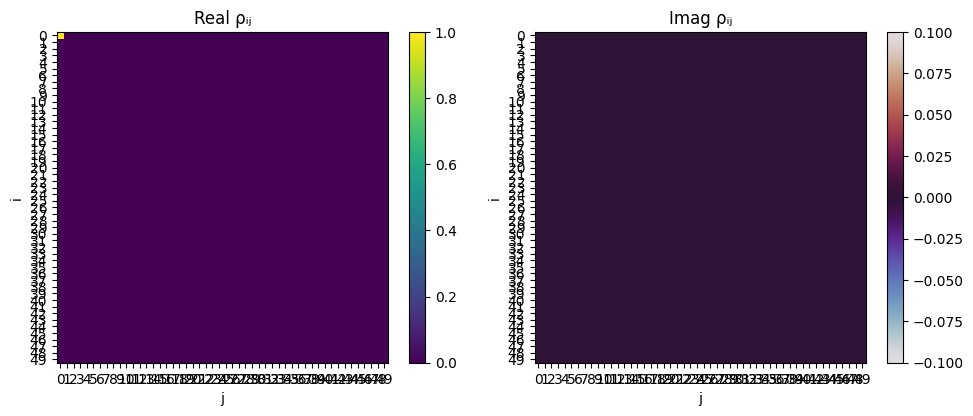

Reconstructed density matrix


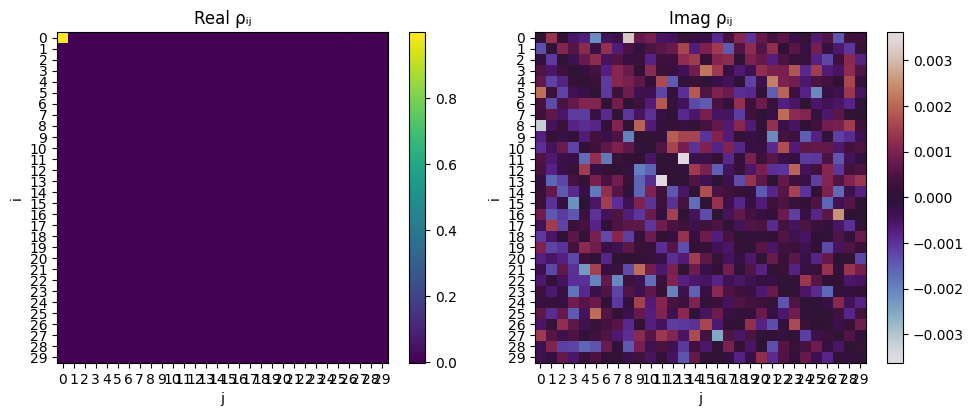

Fidelity:  0.9996124251847635
Original density matrix


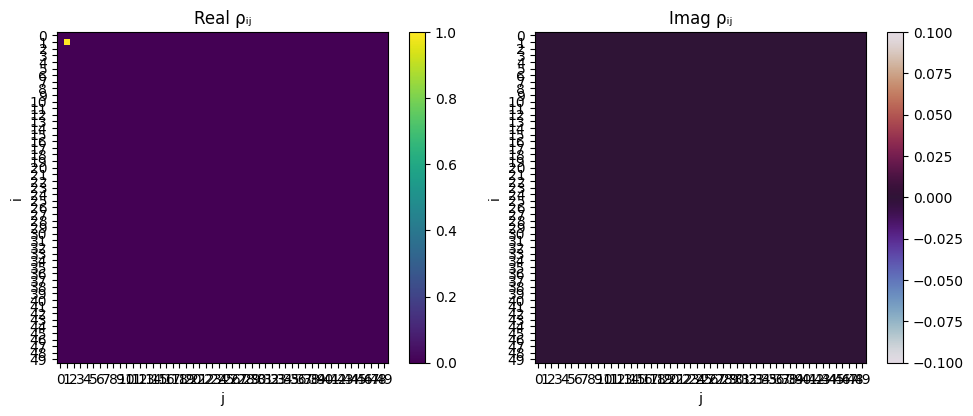

Reconstructed density matrix


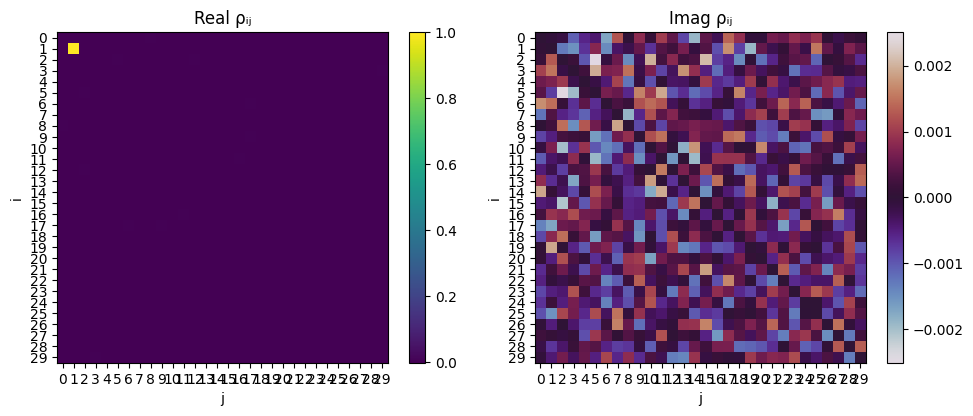

Fidelity:  1.0003089020566966
Original density matrix


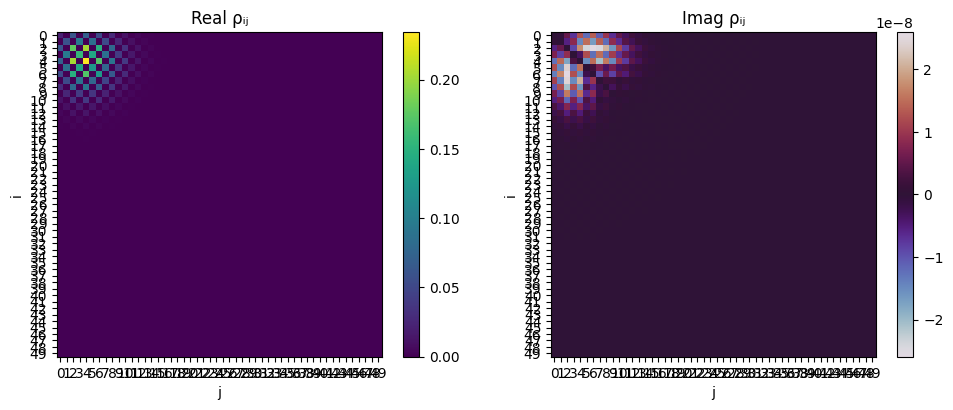

Reconstructed density matrix


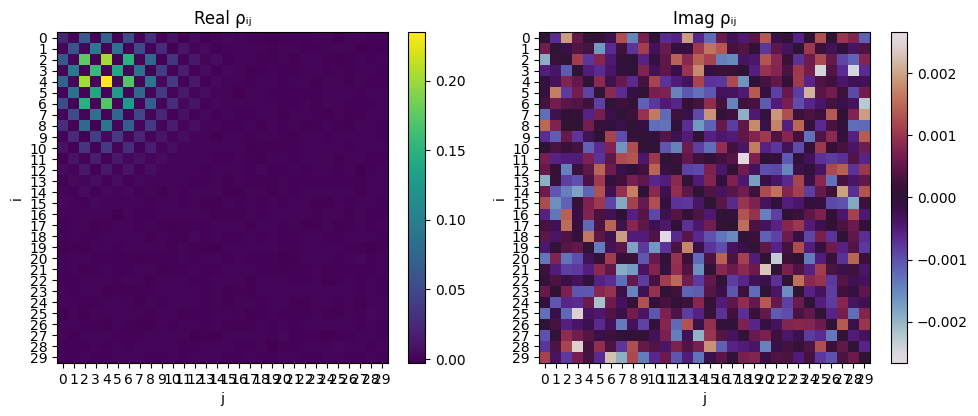

Fidelity:  0.9999634429678854
Original density matrix


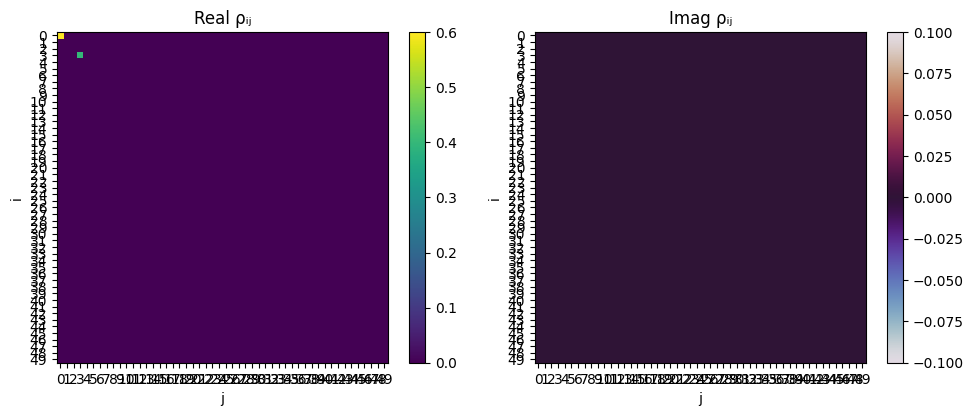

Reconstructed density matrix


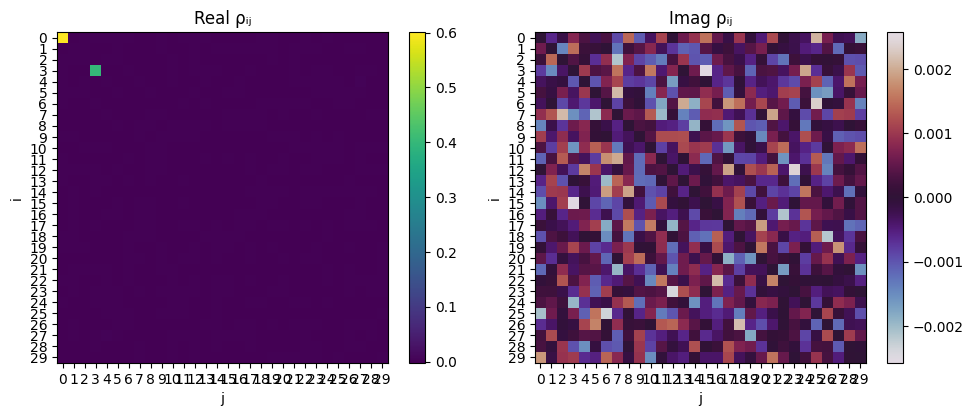

Fidelity:  1.0004075611132452
Original density matrix


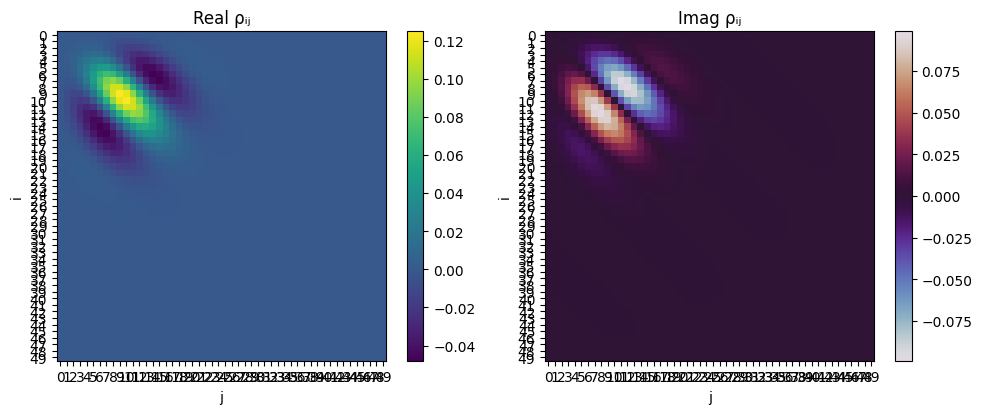

Reconstructed density matrix


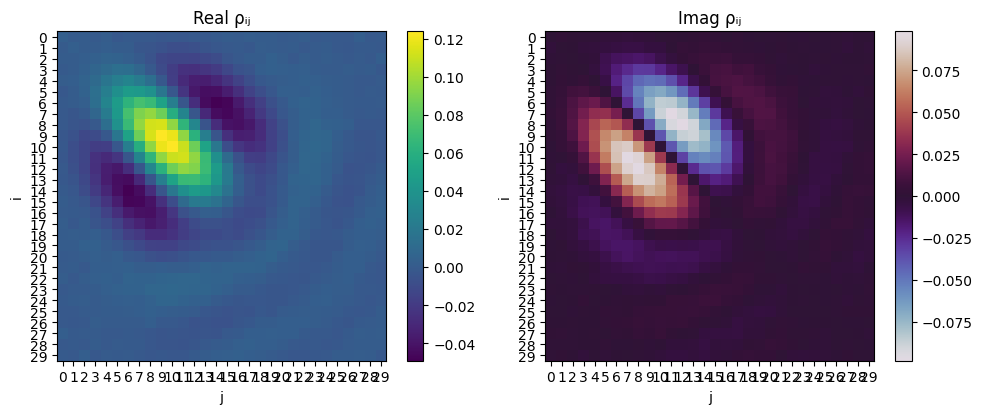

Fidelity:  0.9707444532120797
Original density matrix


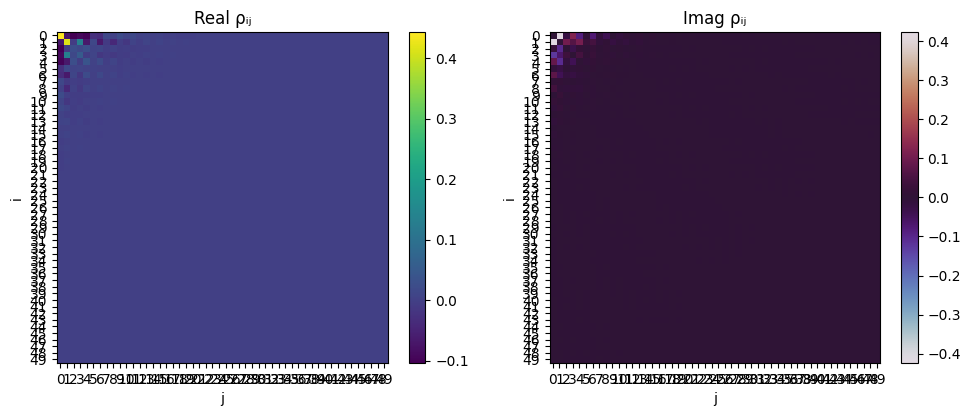

Reconstructed density matrix


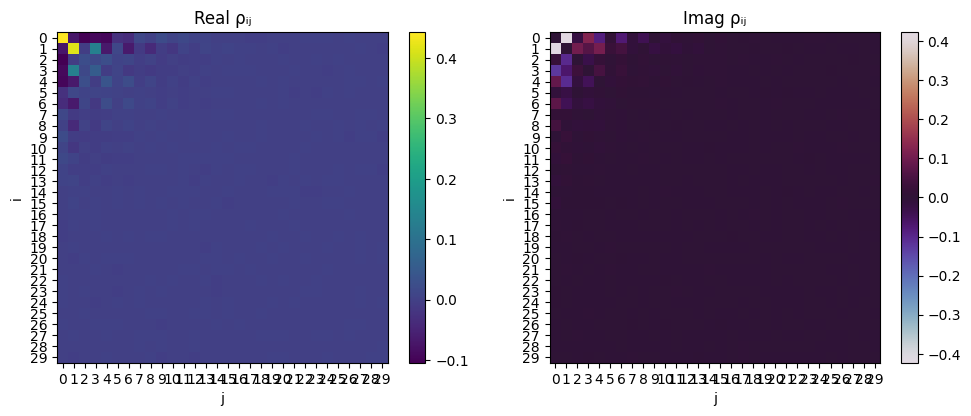

Fidelity:  0.999777867937036
Original density matrix


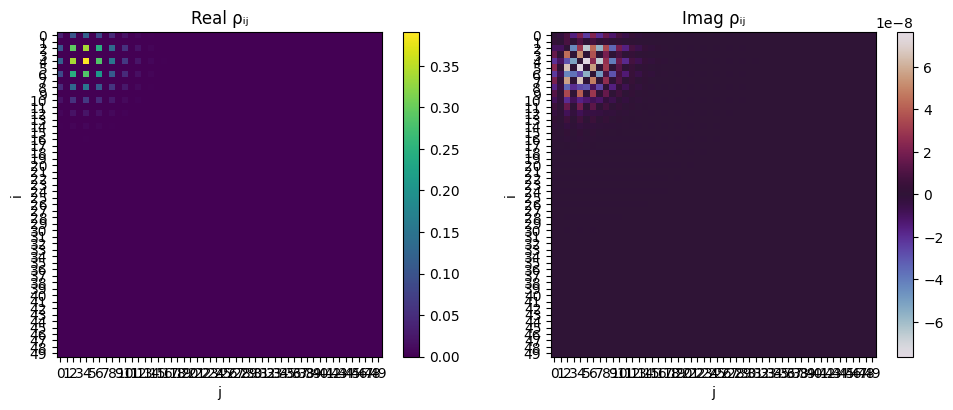

Reconstructed density matrix


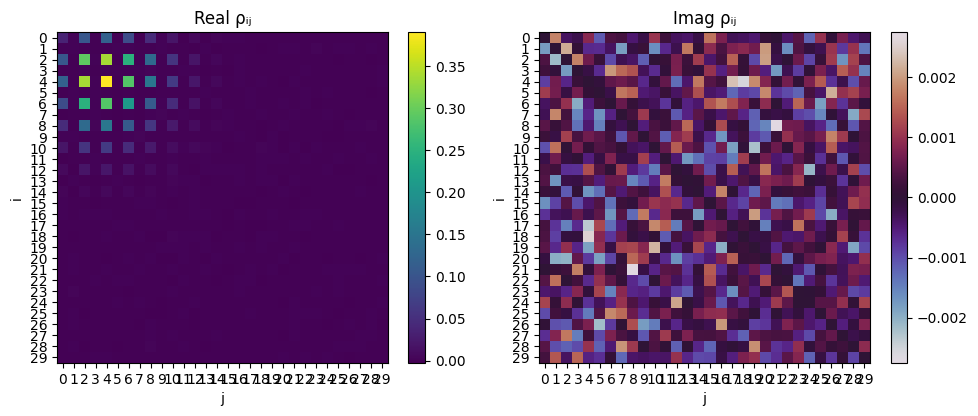

Fidelity:  1.0001424434351138


In [59]:
# Compute the density matrix of perfect state, on with added noise

sigma = 0.01 # want to add noise
list_of_density_to_reconstruct = []

for i in range(7):
    with open(f'quantum_state_{i}.pickle', 'rb') as f:
        list_of_density_to_reconstruct.append(pickle.load(f))


NN = [10,20,30,40,50]

for N in NN:

    xvec = np.linspace(-5, 5, 200)
    l = precomp(N, xvec, xvec)

    for rho in list_of_density_to_reconstruct:


      data = rho[:N,:N]

      W = wigner(Qobj(data, dims=[[N], [N]]),xvec,xvec)
      W = add_wigner_noise(W,sigma)
      r = precomp_reconstr(xvec,xvec,W,N,l)

      print("Original density matrix")
      plot_density_matrix_ri(rho)
      print("Reconstructed density matrix")
      plot_density_matrix_ri(r)

      print("Fidelity: ", fidelity(Qobj(data, dims=[[N], [N]]),Qobj(r, dims=[[N], [N]])))

In [45]:
def downsample_image_with_grid(image, x, y, factor=4, sigma=1):
    """
    Downsample a 2D image using Gaussian smoothing + stride slicing.
    Also adjust x and y grid vectors to match.

    Parameters:
        image (2D array): Input image (e.g., Wigner function)
        x, y (1D arrays): Pixel coordinate vectors along x and y (same size as image shape)
        factor (int): Downsampling factor (e.g., 2, 4, etc.)
        sigma (float): Standard deviation for Gaussian smoothing before downsampling

    Returns:
        image_small (2D array): Downsampled image
        x_small (1D array): Resampled x vector
        y_small (1D array): Resampled y vector
    """
    # Step 1: Smooth the image
    image_smooth = scipy.ndimage.gaussian_filter(image, sigma=sigma)

    # Step 2: Downsample the image
    image_small = image_smooth[::factor, ::factor]

    # Step 3: Downsample the coordinate vectors to match image
    x_small = x[::factor]
    y_small = y[::factor]

    return image_small, x_small, y_small

In [46]:
def estimate_affine_params(z, dx, dy, edge_frac=0.1):
    N = z.shape[0]
    edge = int(edge_frac * N)
    edge_vals = np.concatenate([
        z[:edge, :].ravel(), z[-edge:, :].ravel(),
        z[:, :edge].ravel(), z[:, -edge:].ravel()
    ])
    b = np.nanmean(edge_vals)
    integral = np.nansum(z - b) * dx * dy
    a = 1.0 / integral / 2
    return a, b


In [47]:
import scipy.ndimage
Scal_reduction = 10
N = 30
with open(f'noisy_wigner_0.pickle', 'rb') as f:
    # with open('data/experimental/wigner_cat_minus.pickle', 'rb') as f:
    data = pickle.load(f)

    # Unpack the data
    x = data[0]  # x-axis (position or Re[α])
    y = data[1]  # y-axis (momentum or Im[α])
    z = data[2]  # 2D Wigner function values
    xvec = np.array(x) #* np.sqrt(2)
    yvec = np.array(y) #* np.sqrt(2)
    W_input = np.array(z)

    W_reduce, xr,yr = downsample_image_with_grid(W_input,xvec,yvec,Scal_reduction)
    l = precomp(N, xr, yr)

0/30
1/30
2/30
3/30
4/30
5/30
6/30
7/30
8/30
9/30
10/30
11/30
12/30
13/30
14/30
15/30
16/30
17/30
18/30
19/30
20/30
21/30
22/30
23/30
24/30
25/30
26/30
27/30
28/30
29/30


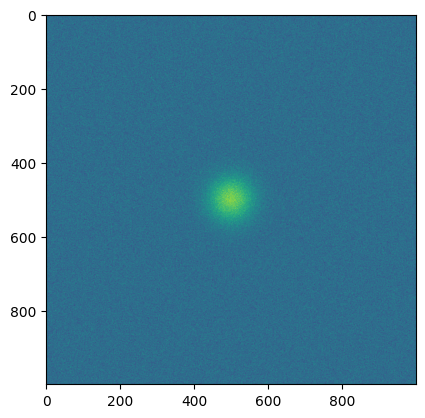

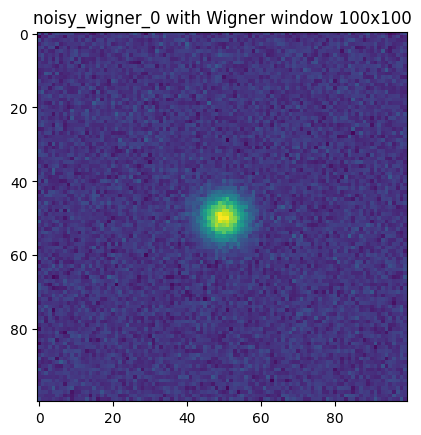

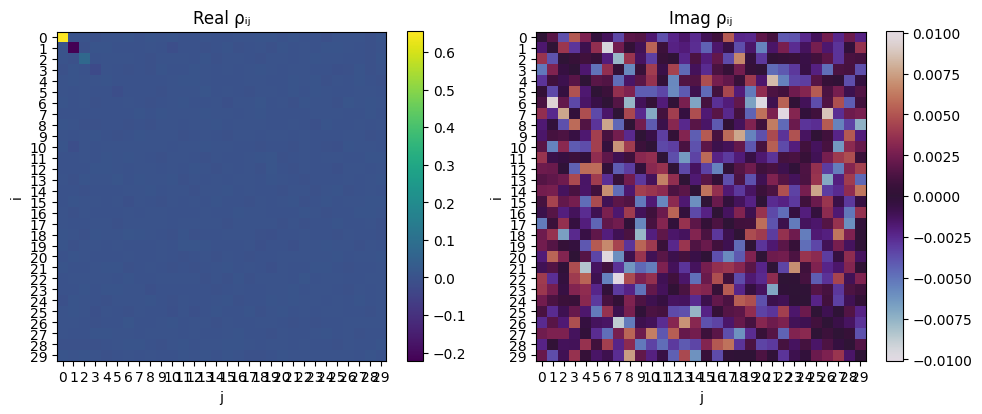

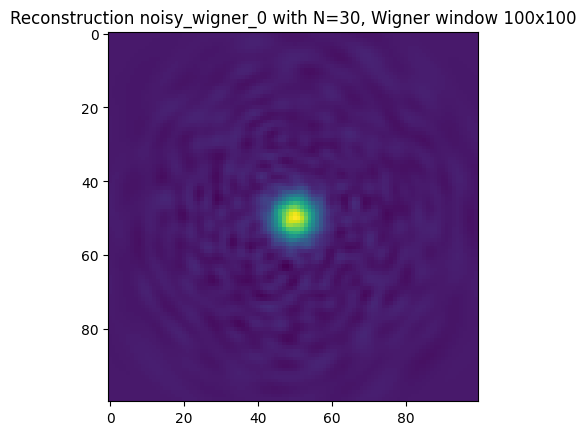

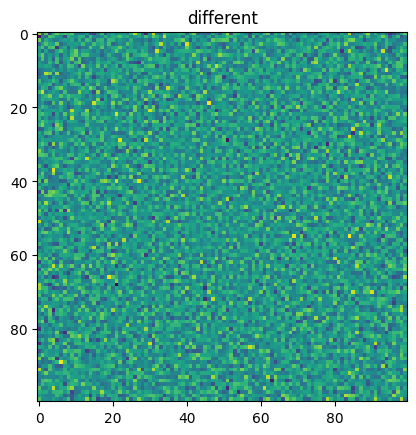

mean :  1.8993522961154947e-05


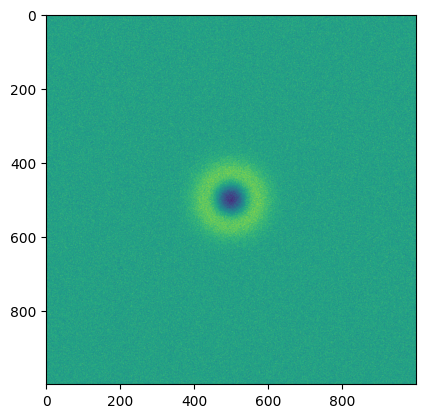

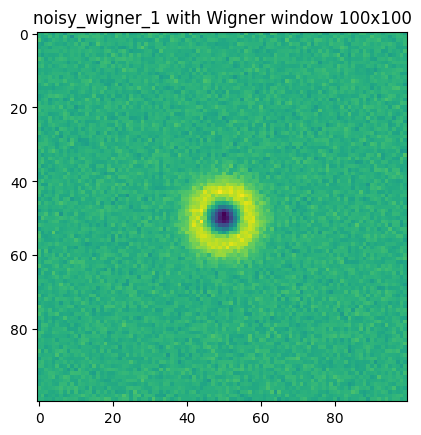

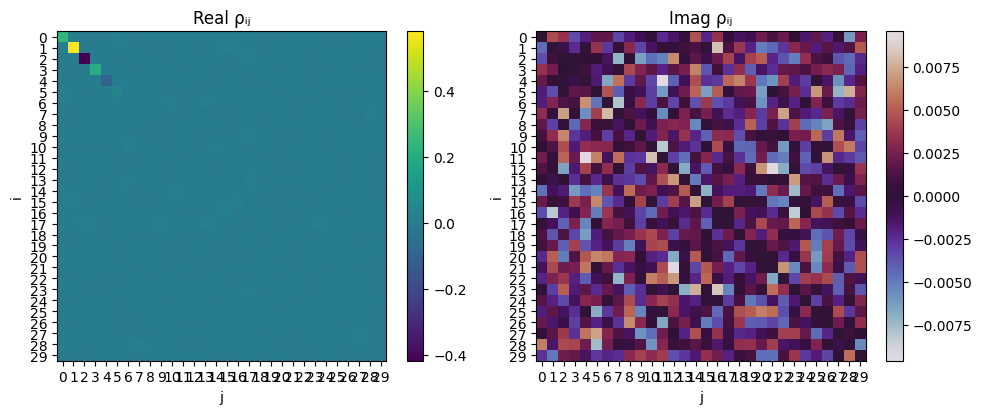

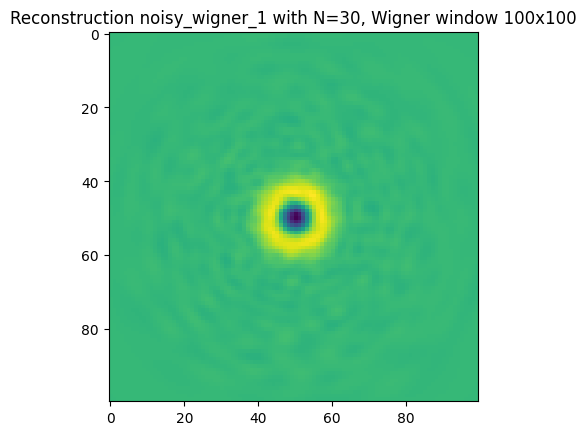

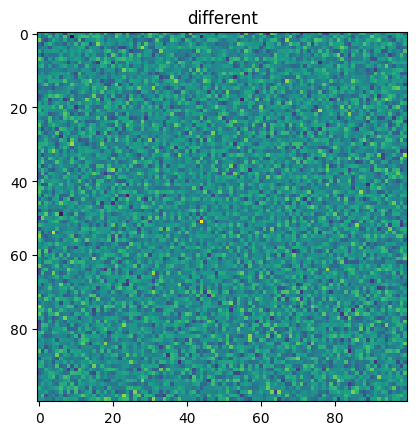

mean :  2.7277074332715567e-05


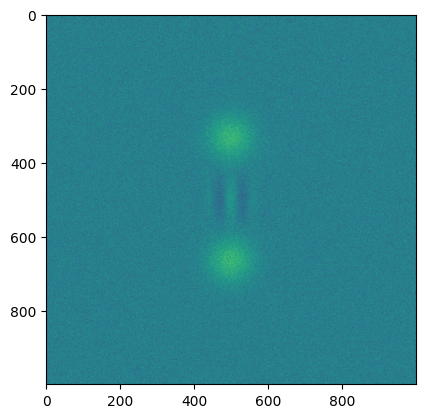

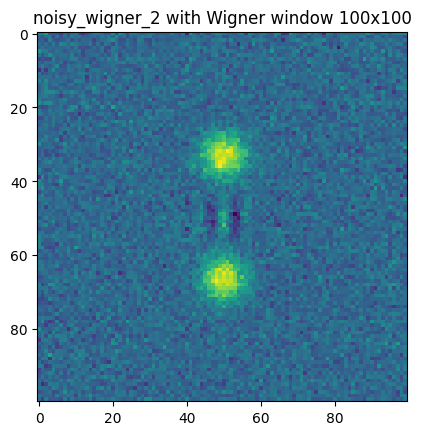

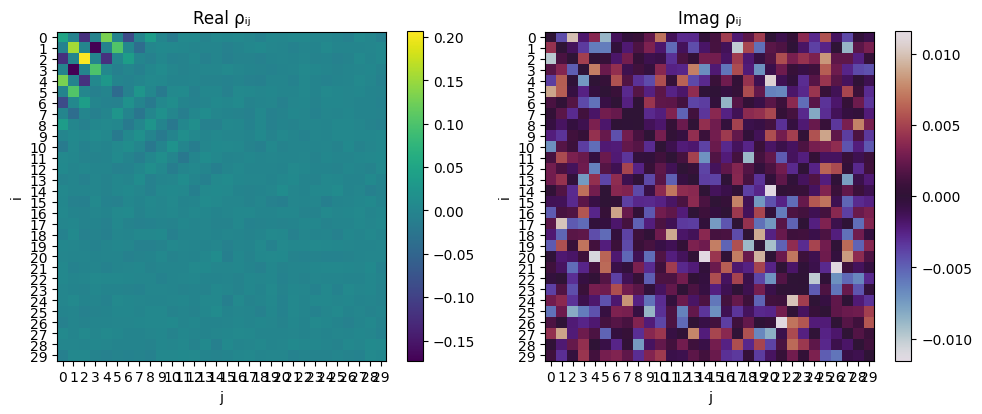

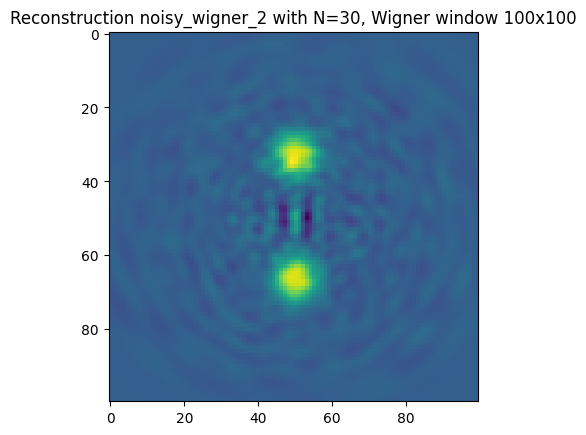

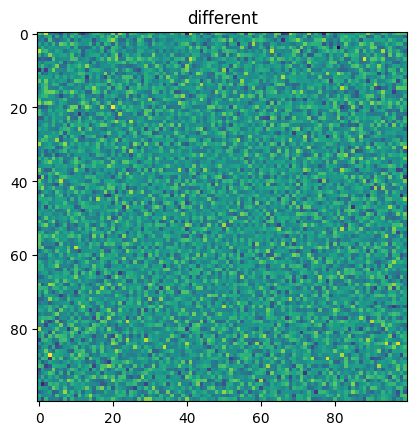

mean :  3.184761379596167e-06


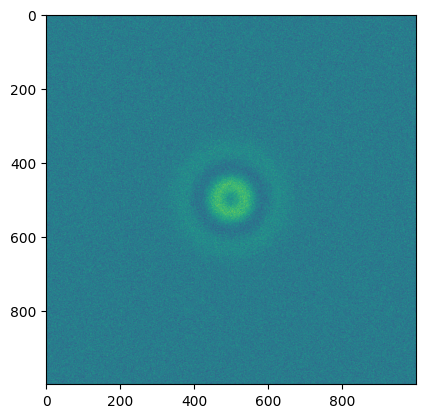

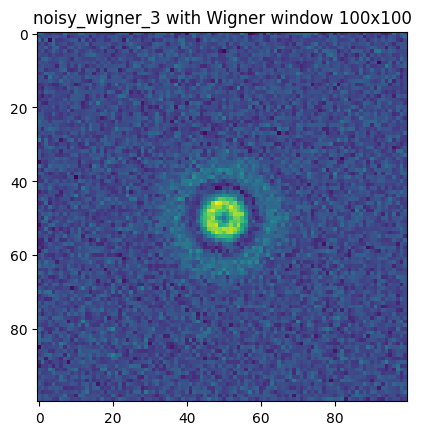

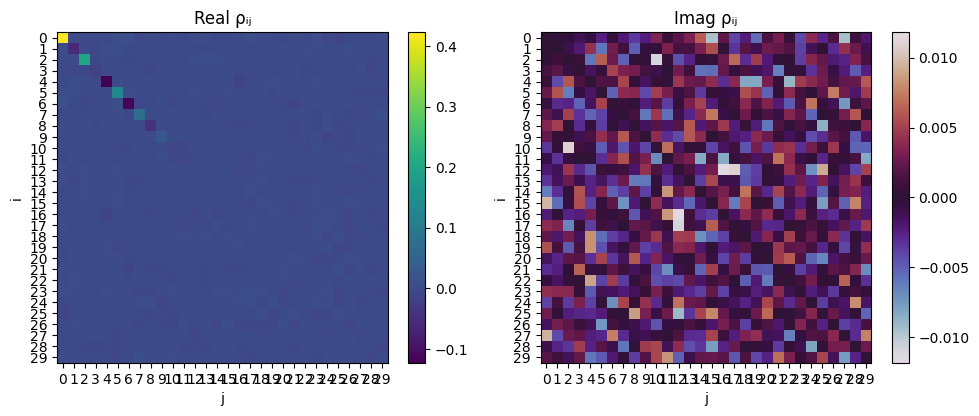

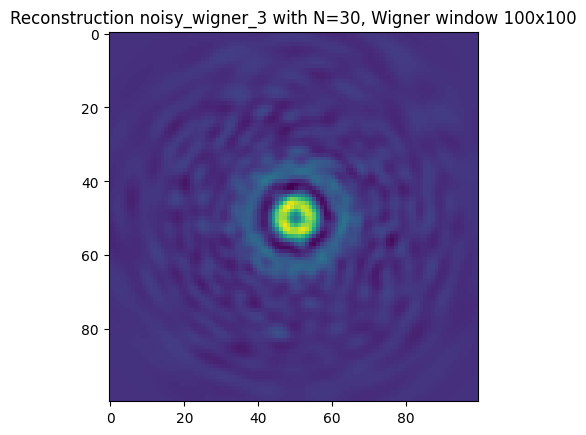

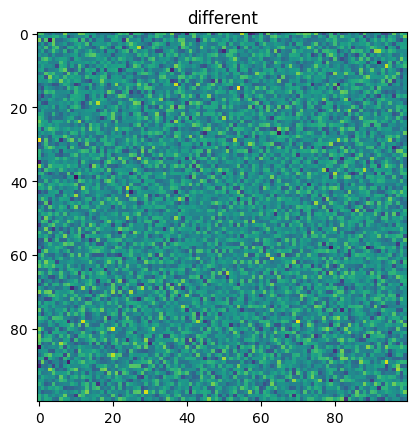

mean :  5.66059647734596e-06


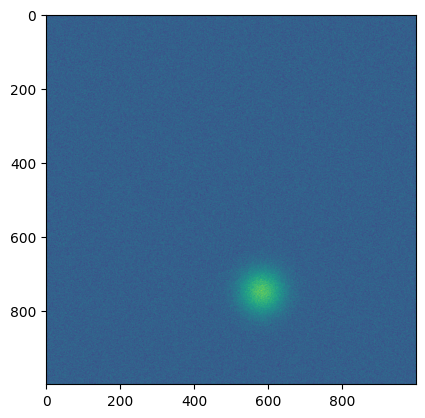

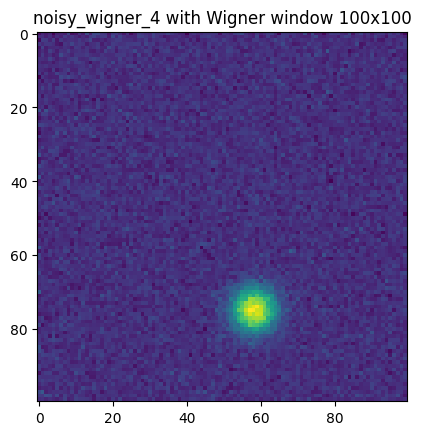

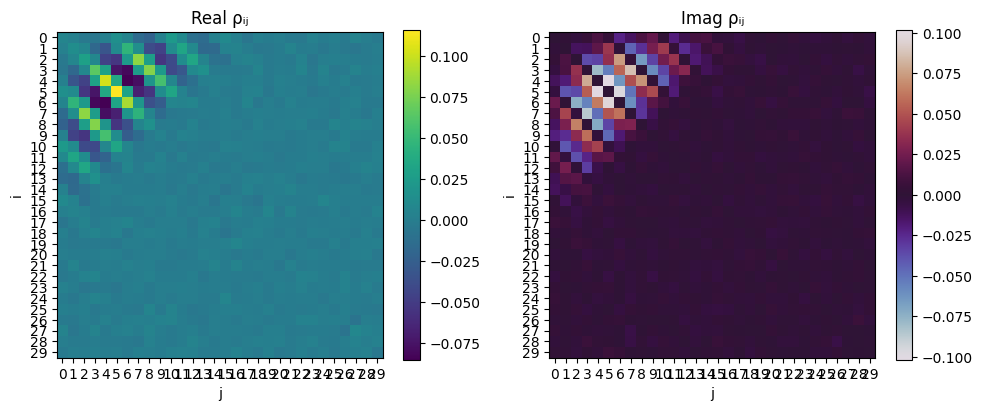

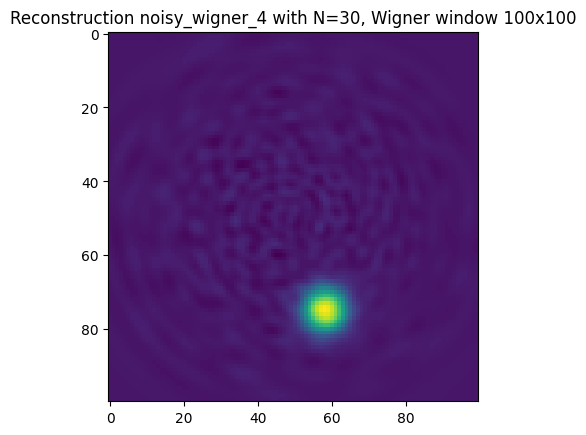

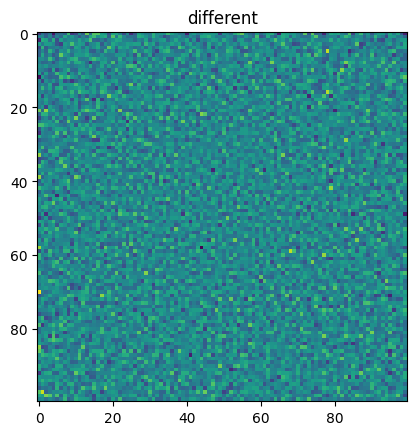

mean :  -4.471254584033002e-05


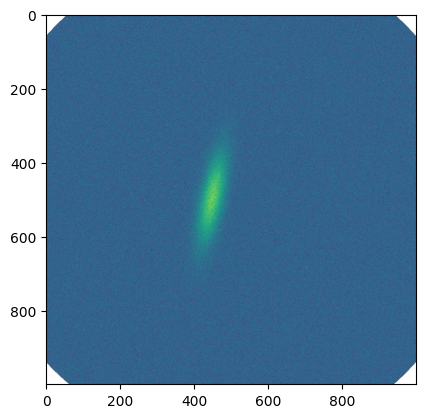

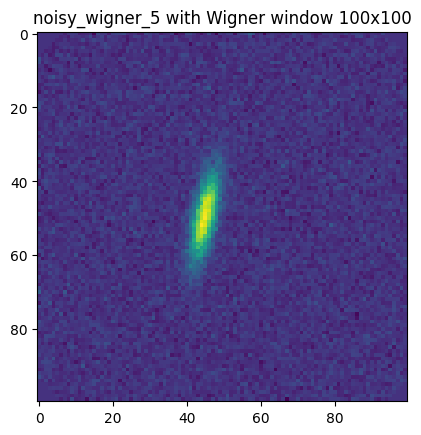

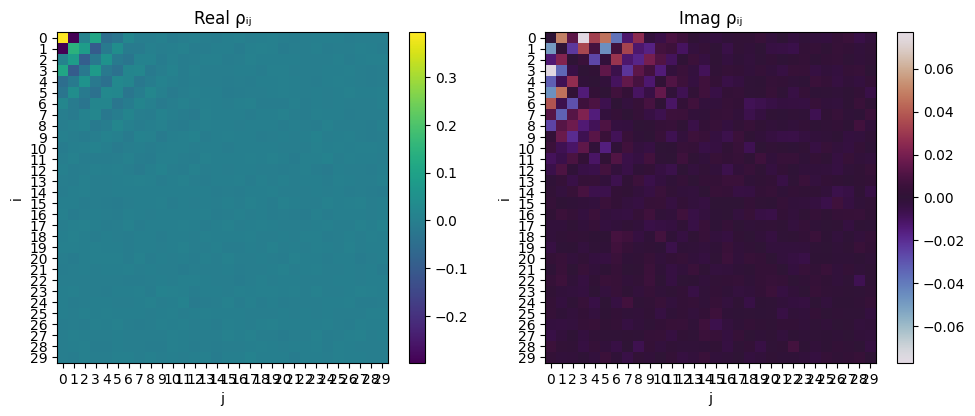

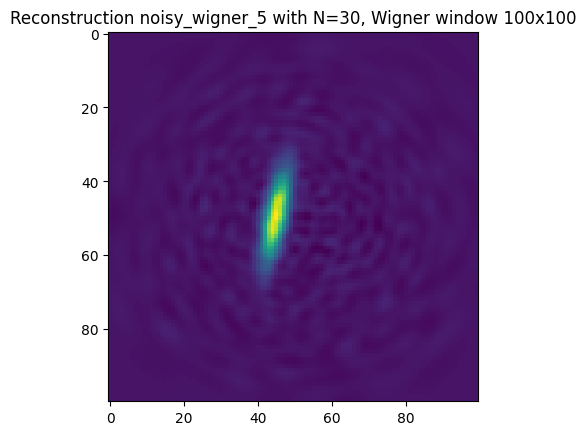

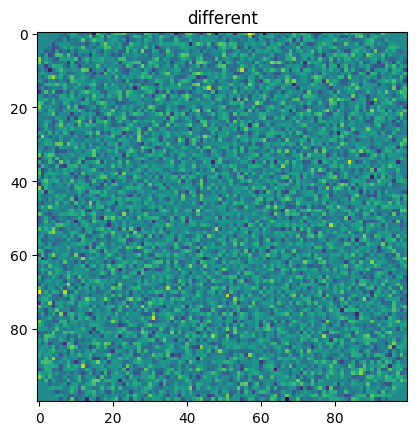

mean :  1.4245913914888e-05


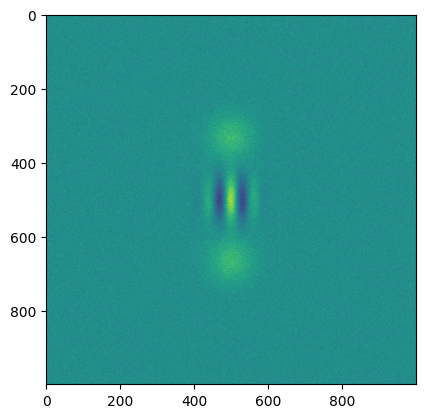

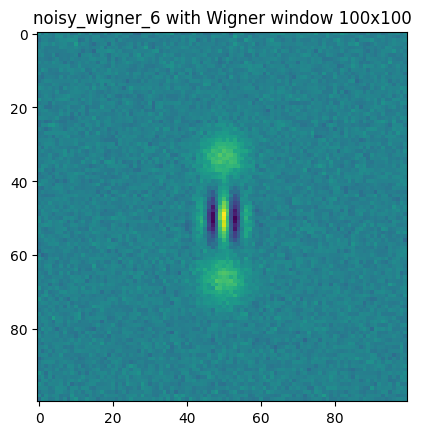

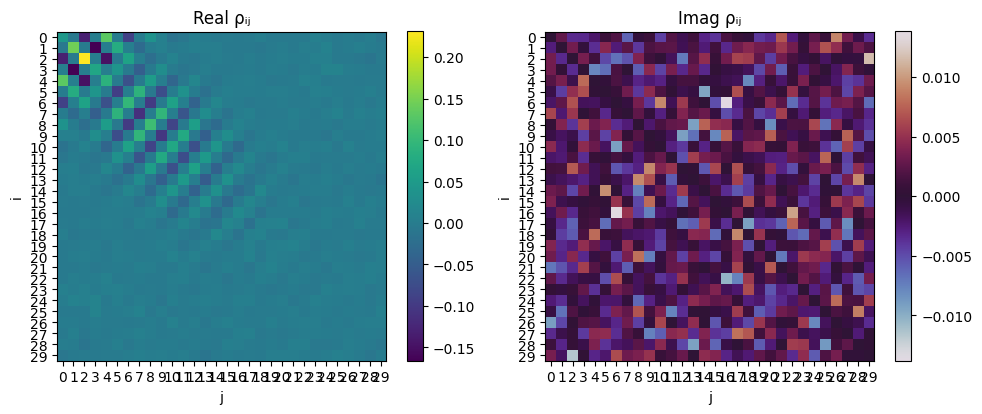

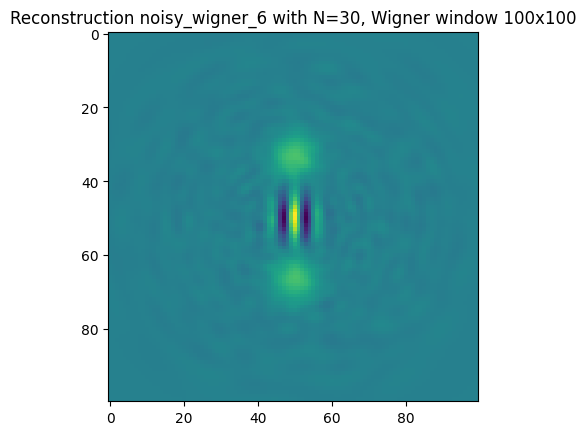

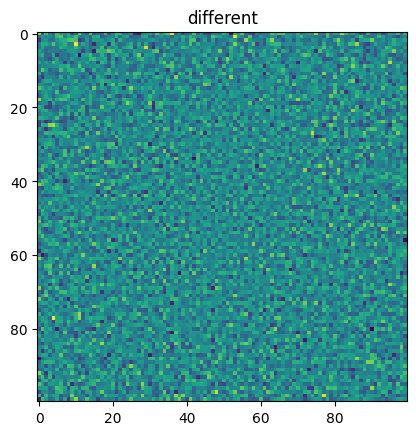

mean :  -2.4151614044104415e-05


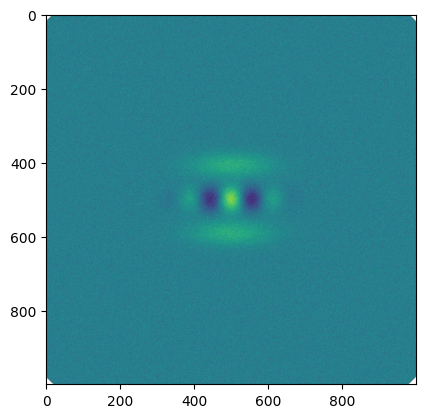

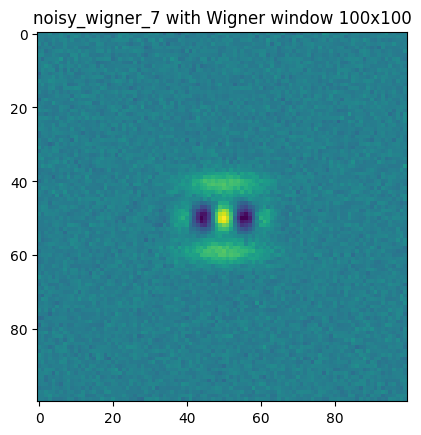

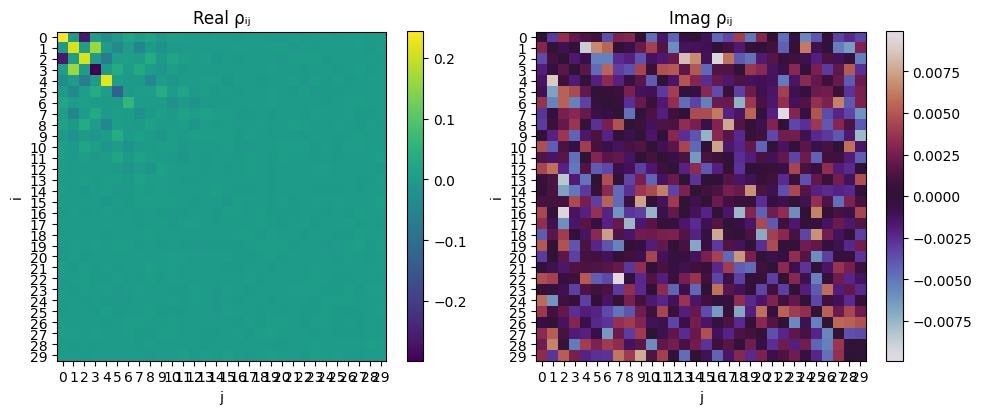

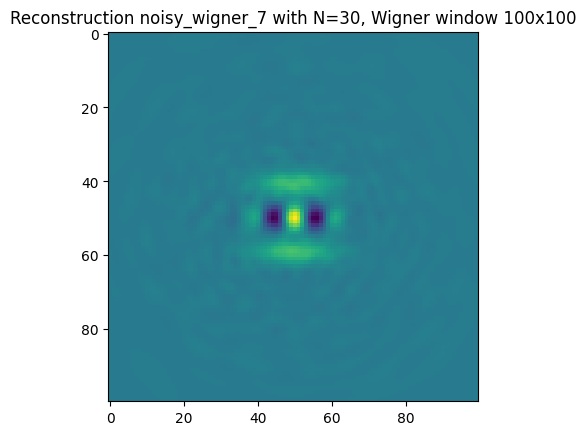

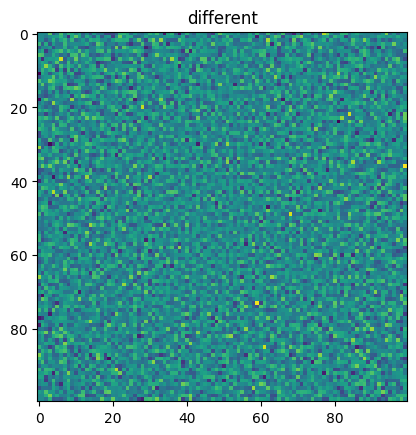

mean :  -6.768341267182096e-06


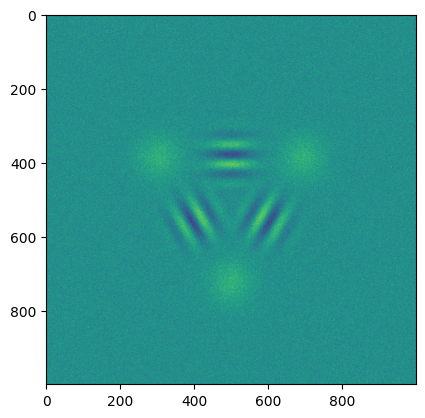

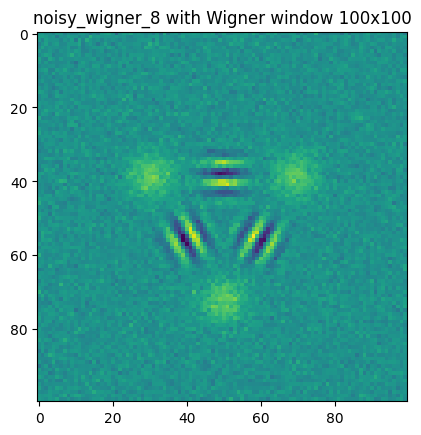

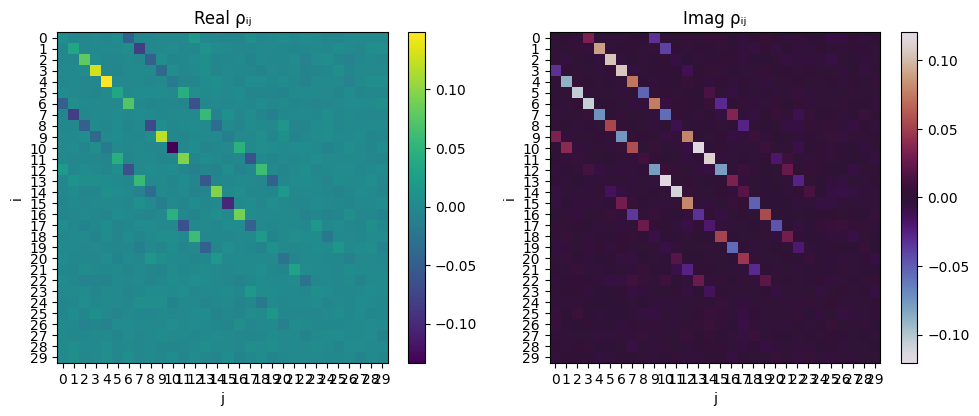

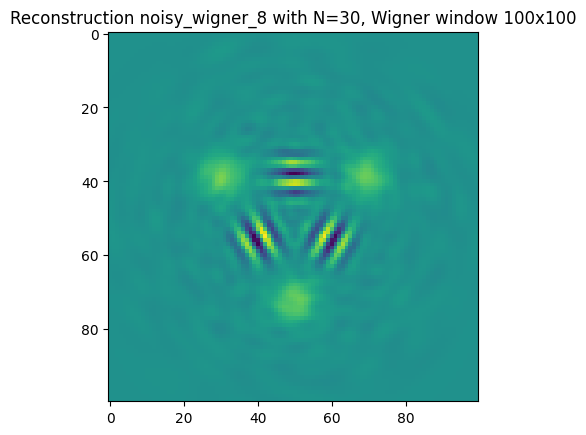

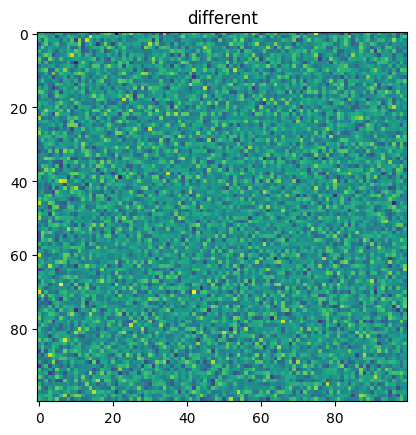

mean :  -8.601192806726611e-06


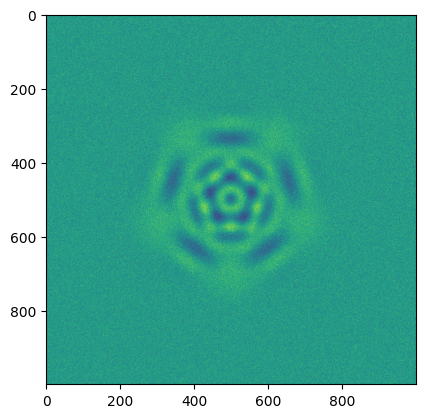

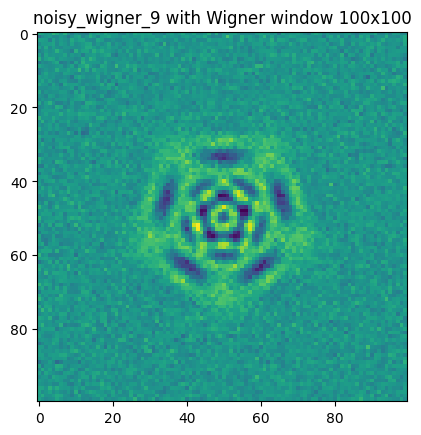

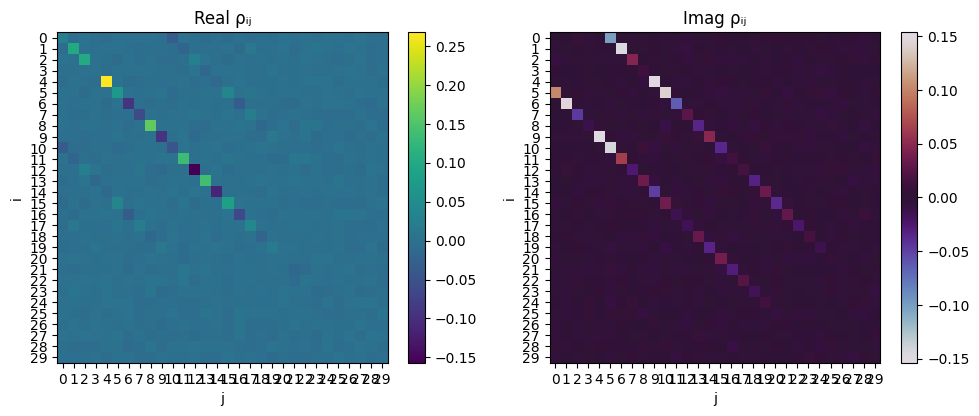

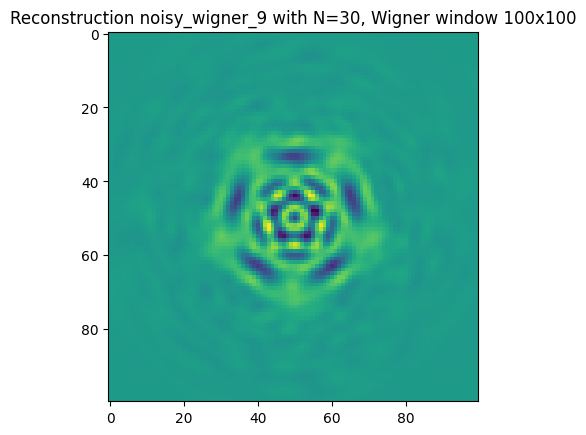

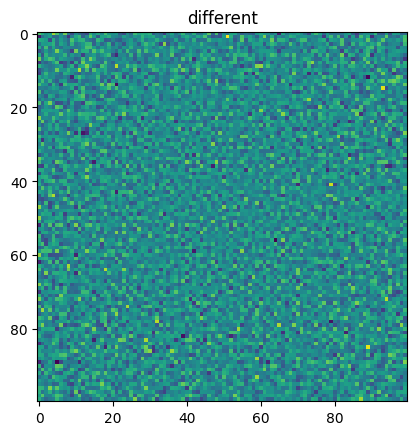

mean :  3.919378745148762e-05


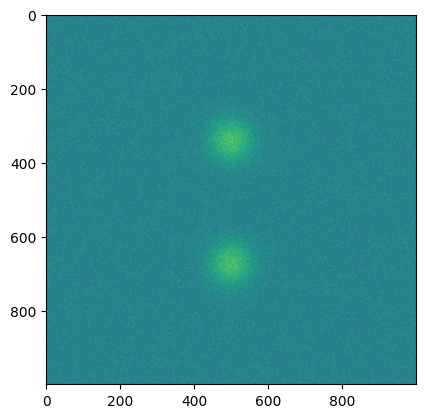

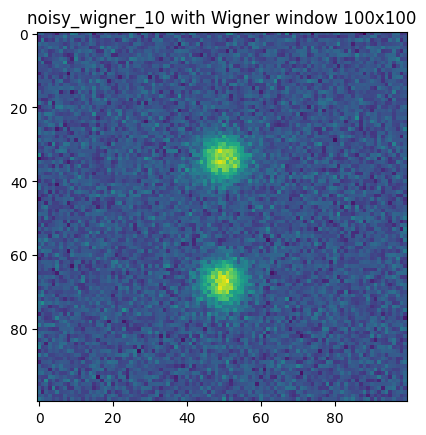

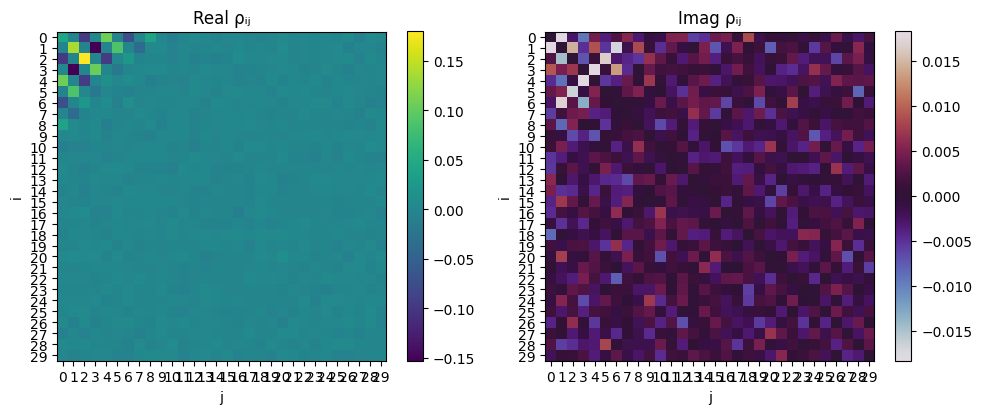

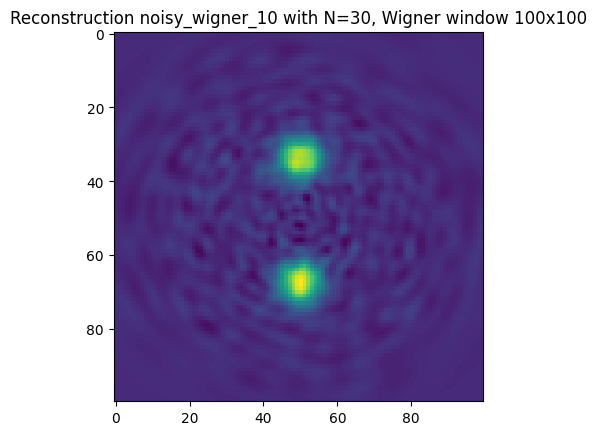

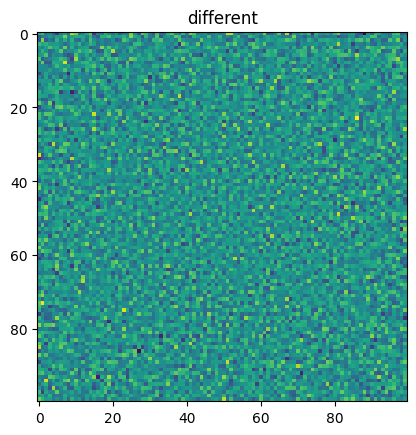

mean :  -1.829637048998395e-06


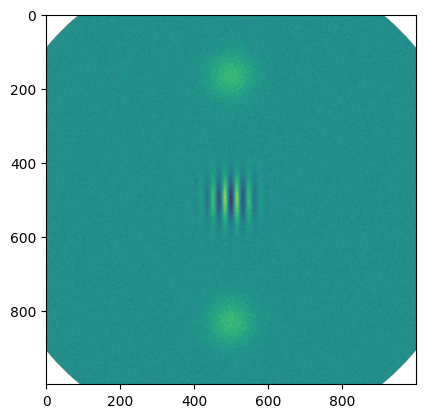

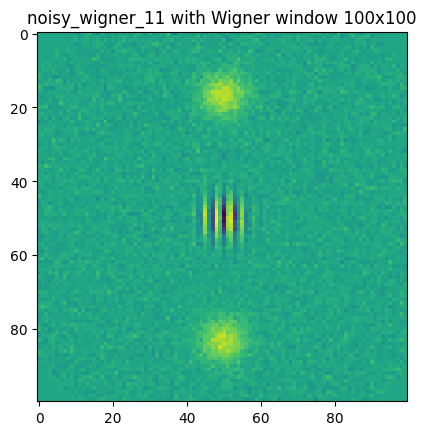

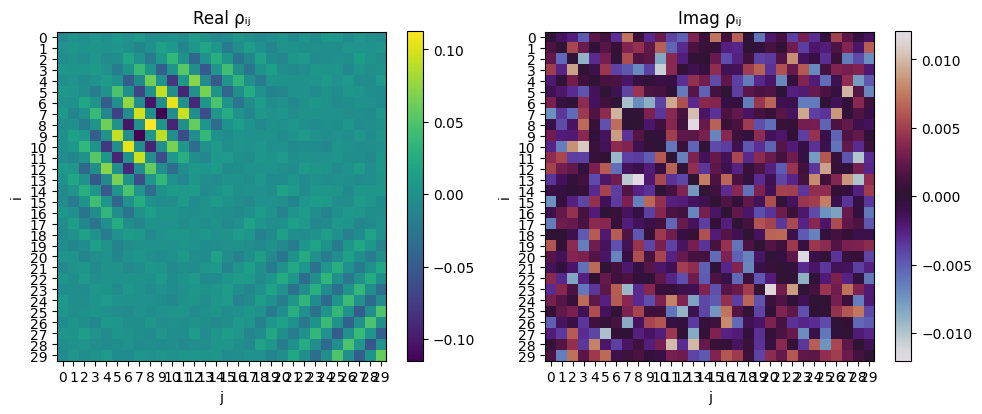

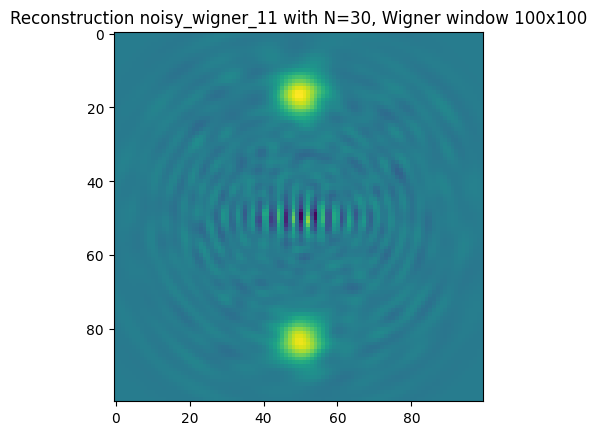

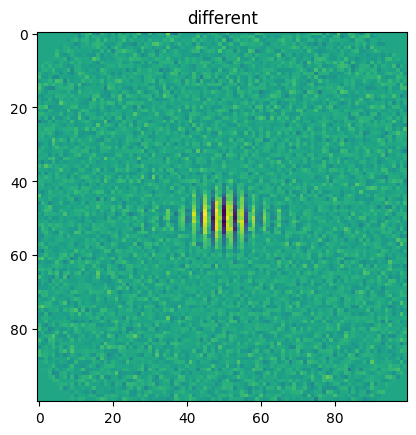

mean :  -2.8993686462562363e-05


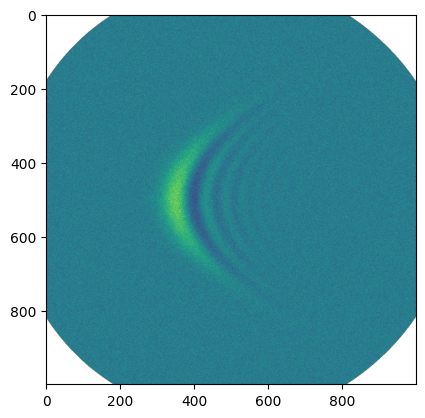

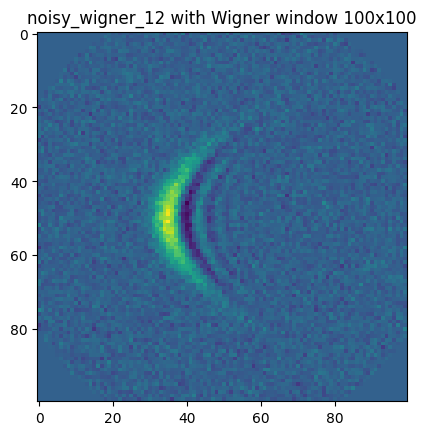

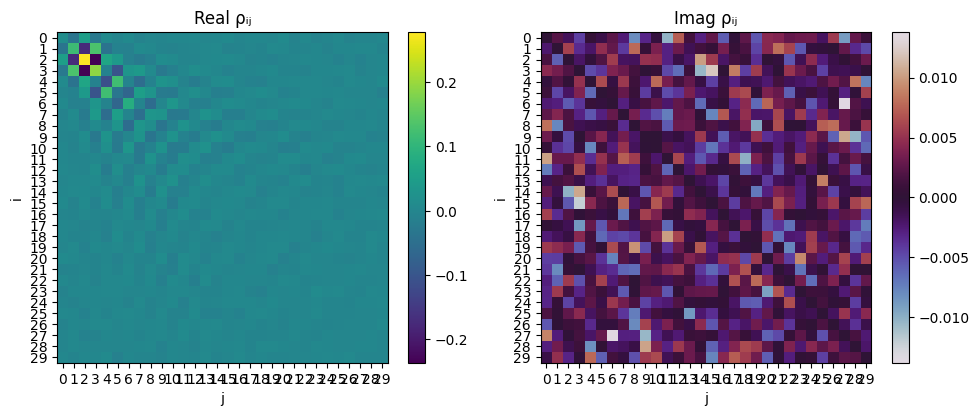

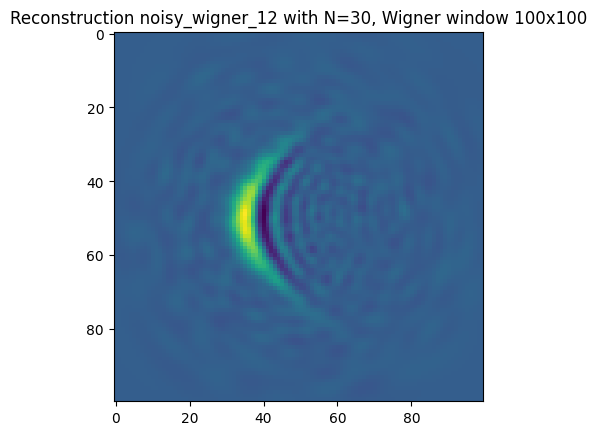

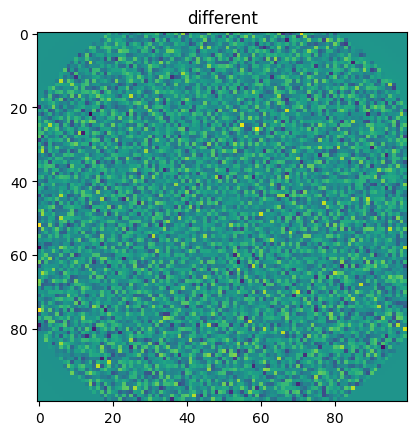

mean :  1.2709491247978878e-07


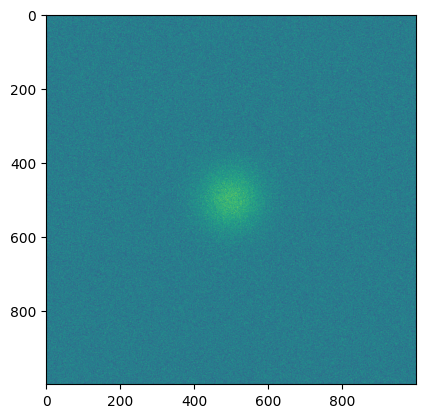

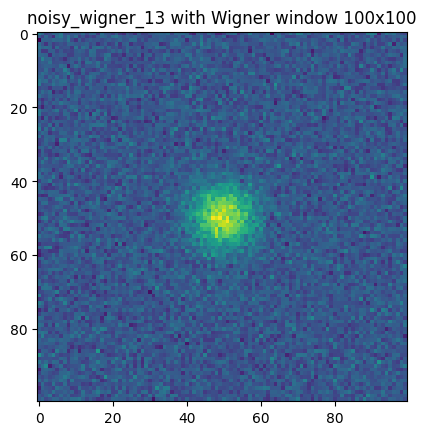

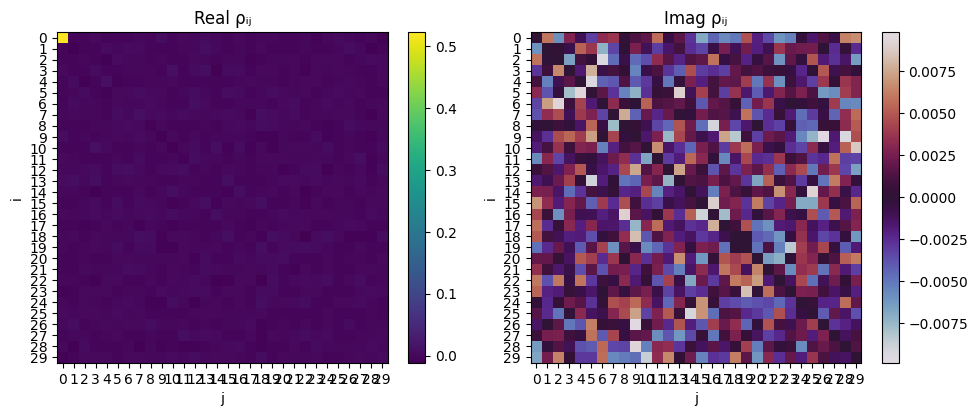

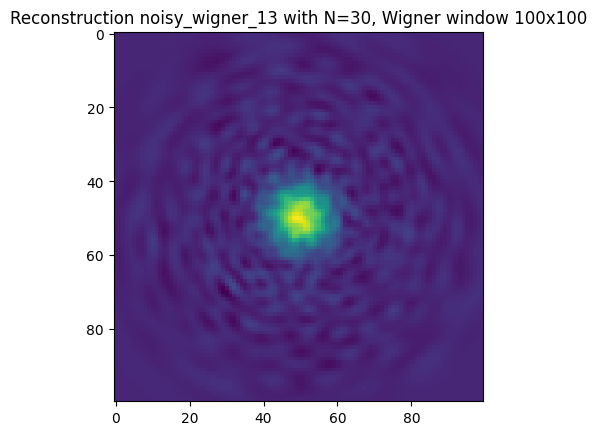

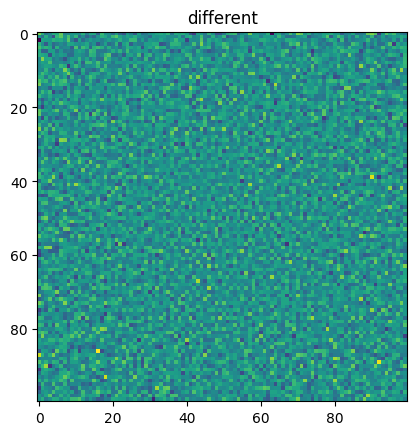

mean :  5.719516133507467e-05


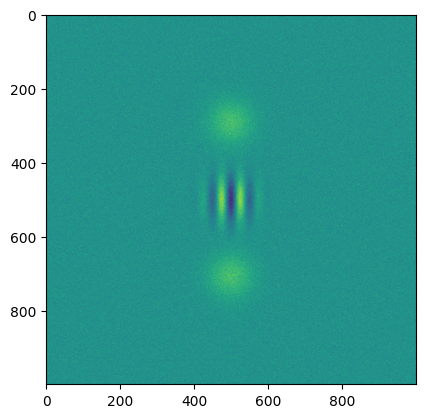

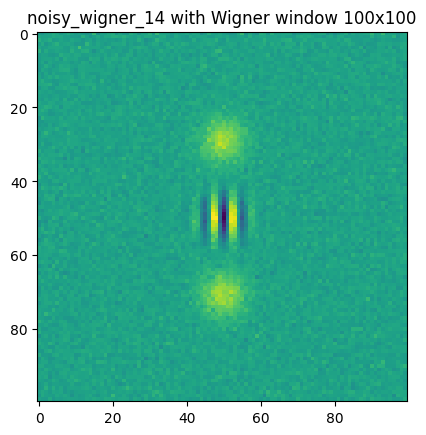

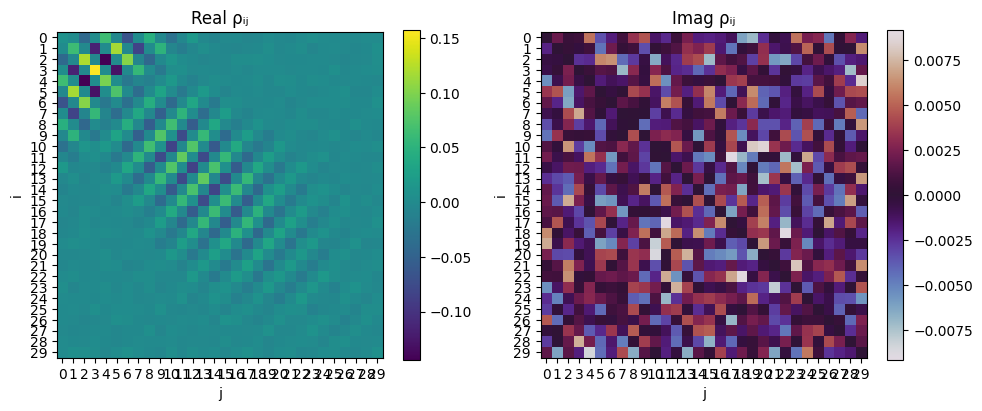

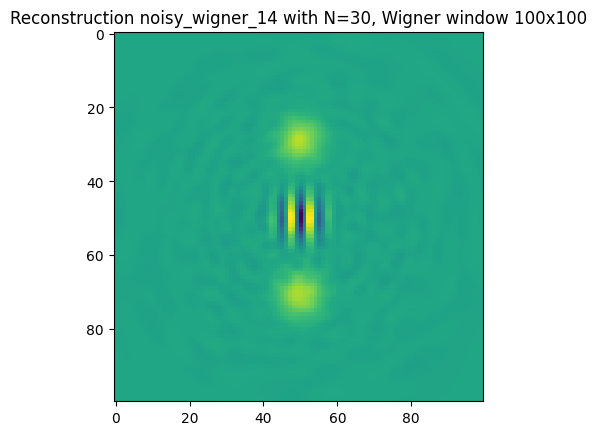

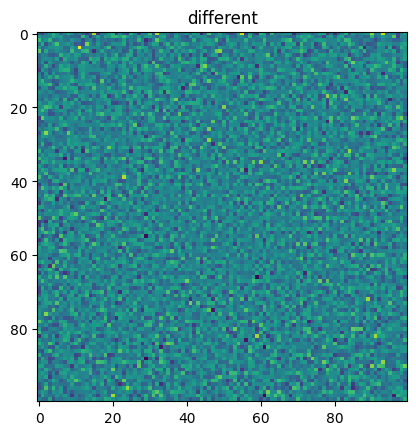

mean :  -7.307810620500901e-05


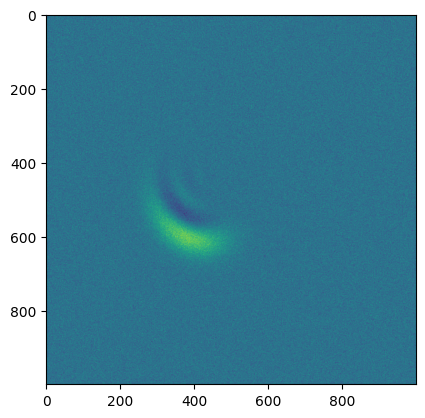

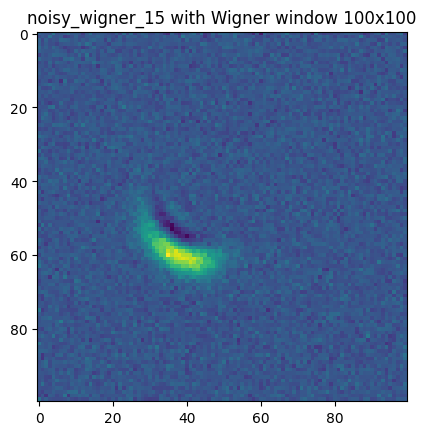

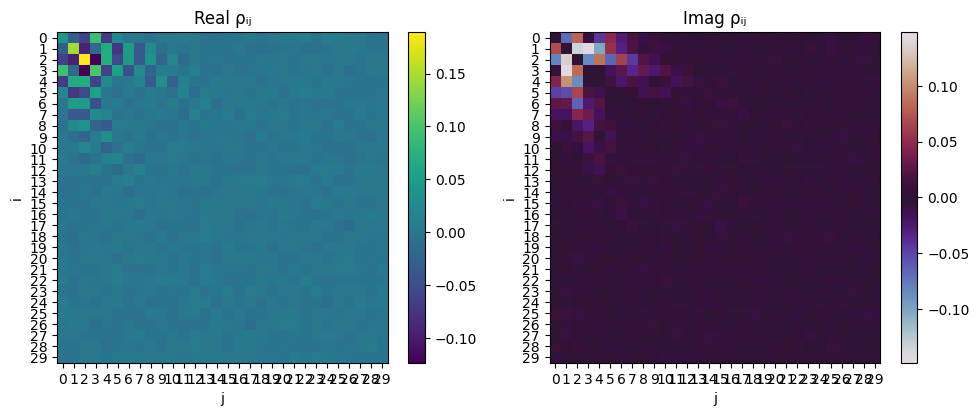

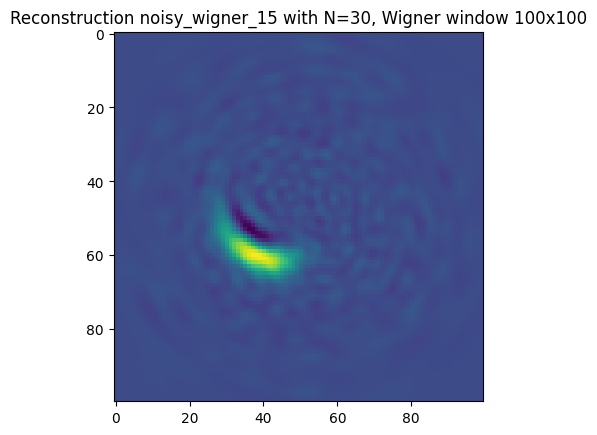

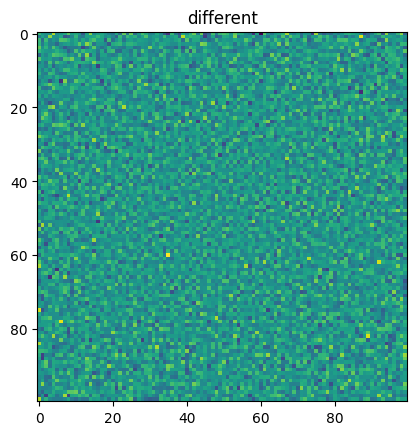

mean :  1.61101702471454e-05


In [48]:




for problem_idx in [0, 1, 2, 3, 4, 5, 6, 7,8,9,10,11,12,13,14,15]:

    with open(f'noisy_wigner_{problem_idx}.pickle', 'rb') as f:
    # with open('data/experimental/wigner_cat_minus.pickle', 'rb') as f:
        data = pickle.load(f)

    # Unpack the data
    x = data[0]  # x-axis (position or Re[α])
    y = data[1]  # y-axis (momentum or Im[α])
    z = data[2]  # 2D Wigner function values
    xvec = np.array(x) #* np.sqrt(2)
    yvec = np.array(y) #* np.sqrt(2)
    W_input = np.array(z)

    plt.imshow(W_input)
    plt.show()
    W_reduce, xr,yr = downsample_image_with_grid(W_input,xvec,yvec,Scal_reduction)

    dx = xr[1]-xr[0]
    dy = yr[1]-yr[0]

    a, b = estimate_affine_params(W_reduce, dx, dy)
    W_reduce = a * (W_reduce - b)
    W_reduce = np.nan_to_num(W_reduce, nan=0.0)

    plt.title(f"noisy_wigner_{problem_idx} with Wigner window 100x100")
    plt.imshow(W_reduce)
    plt.show()

    r = precomp_reconstr(xr,yr,W_reduce,N,l)

    plot_density_matrix_ri(r)



    W_reconstruct = wigner(Qobj(r, dims=[[N], [N]]),xr,yr)
    plt.title(f"Reconstruction noisy_wigner_{problem_idx} with N=30, Wigner window 100x100")
    plt.imshow(W_reconstruct)
    plt.show()

    DW = W_reduce-W_reconstruct
    plt.title("different")
    plt.imshow(DW)
    plt.show()



    print("mean : ", np.mean(DW))


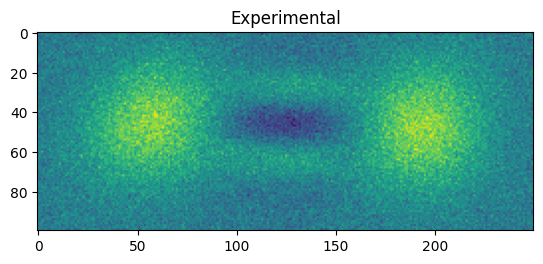

0/20
1/20
2/20
3/20
4/20
5/20
6/20
7/20
8/20
9/20
10/20
11/20
12/20
13/20
14/20
15/20
16/20
17/20
18/20
19/20


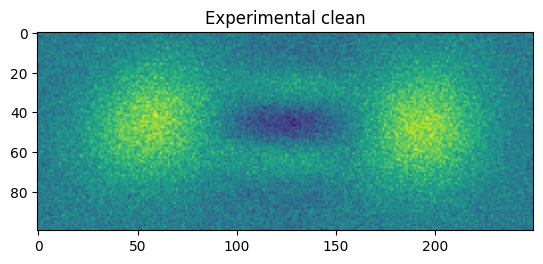

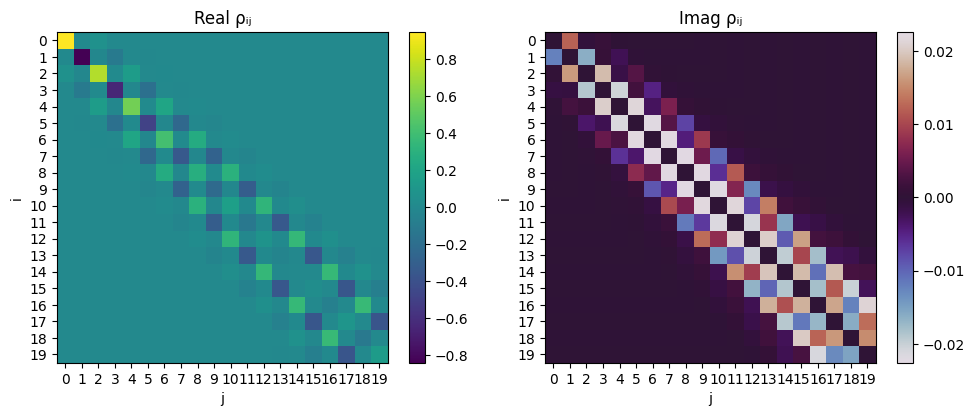

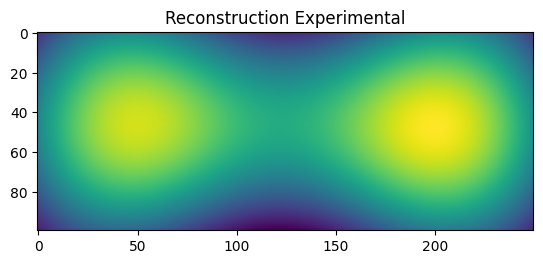

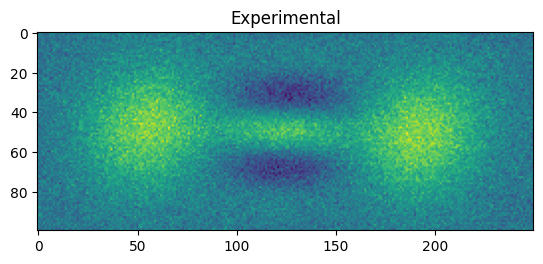

0/20
1/20
2/20
3/20
4/20
5/20
6/20
7/20
8/20
9/20
10/20
11/20
12/20
13/20
14/20
15/20
16/20
17/20
18/20
19/20


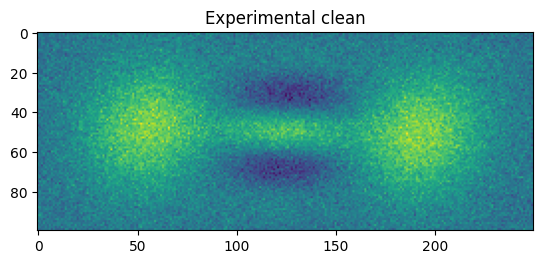

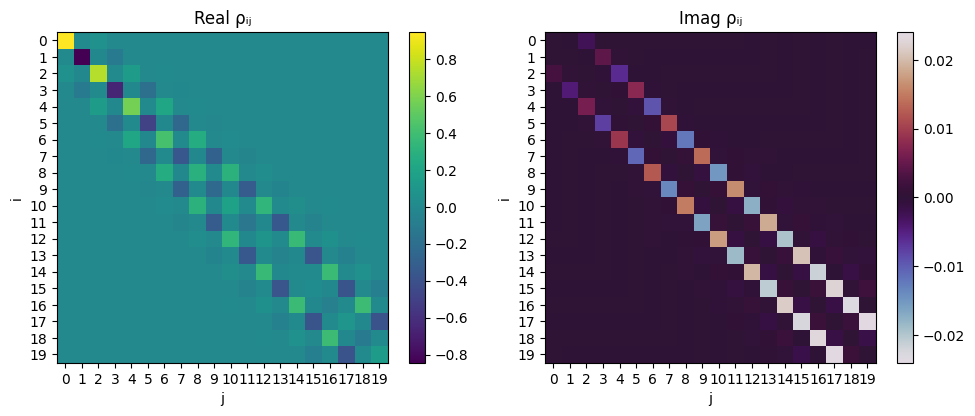

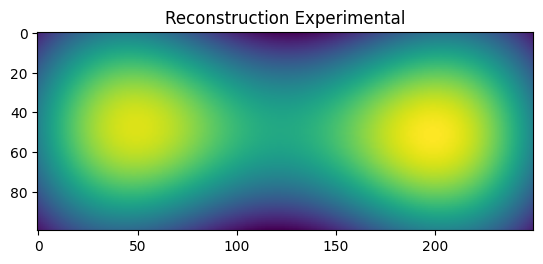

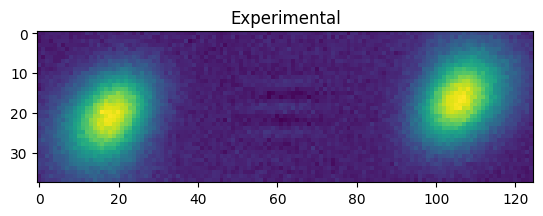

0/20
1/20
2/20
3/20
4/20
5/20
6/20
7/20
8/20
9/20
10/20
11/20
12/20
13/20
14/20
15/20
16/20
17/20
18/20
19/20


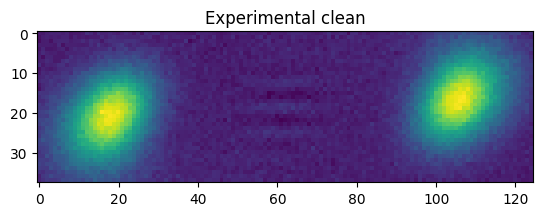

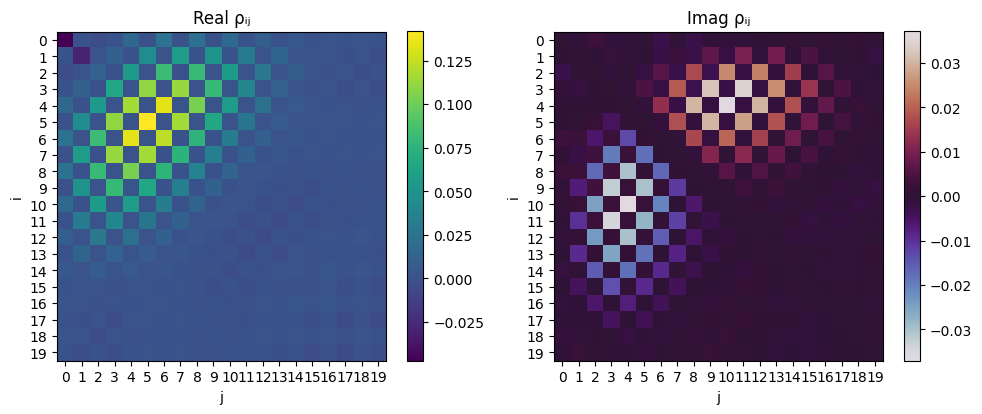

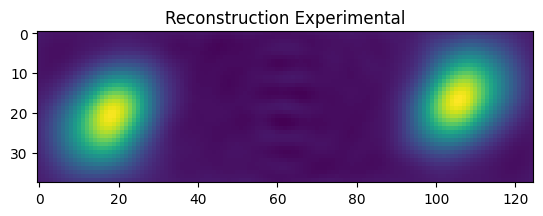

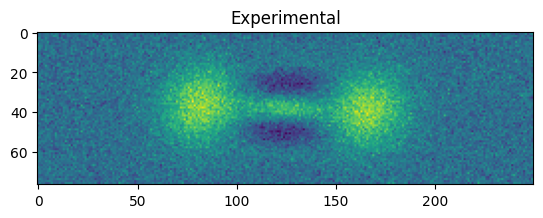

0/20
1/20
2/20
3/20
4/20
5/20
6/20
7/20
8/20
9/20
10/20
11/20
12/20
13/20
14/20
15/20
16/20
17/20
18/20
19/20


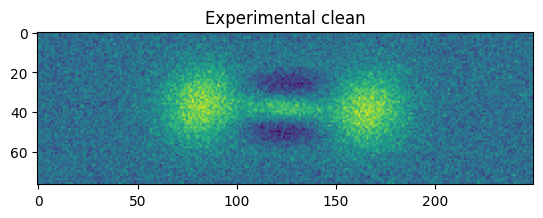

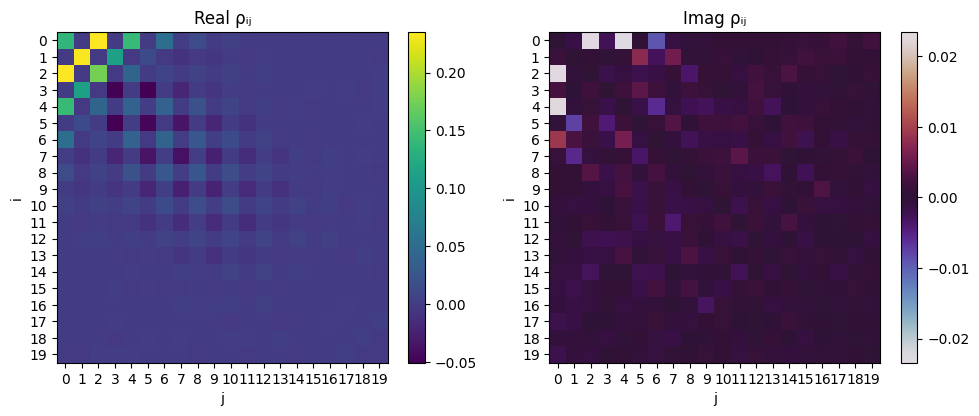

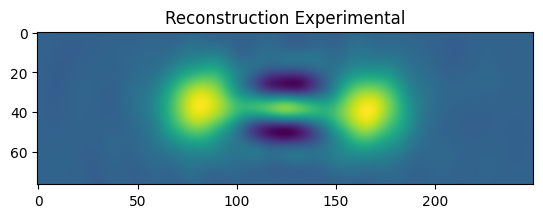

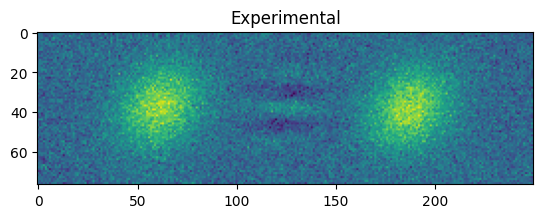

0/20
1/20
2/20
3/20
4/20
5/20
6/20
7/20
8/20
9/20
10/20
11/20
12/20
13/20
14/20
15/20
16/20
17/20
18/20
19/20


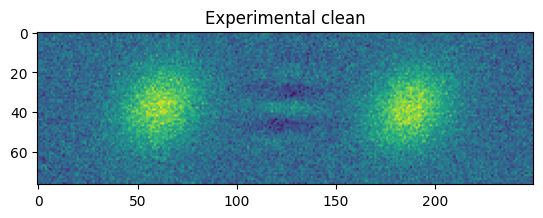

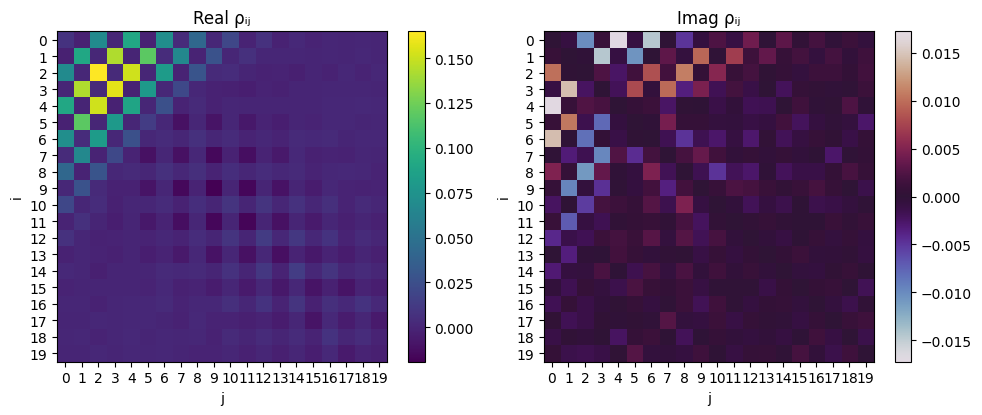

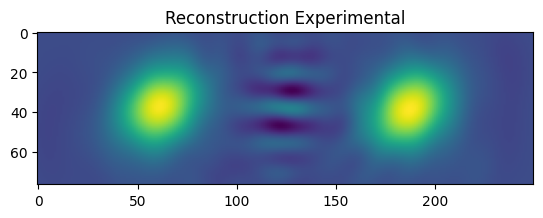

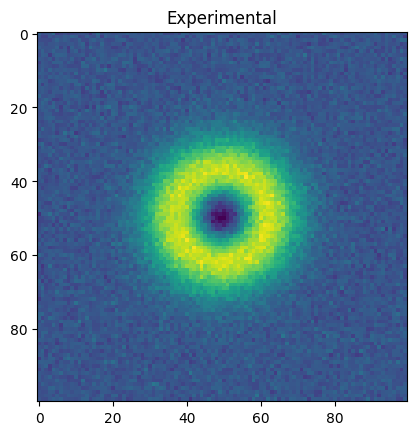

0/20
1/20
2/20
3/20
4/20
5/20
6/20
7/20
8/20
9/20
10/20
11/20
12/20
13/20
14/20
15/20
16/20
17/20
18/20
19/20


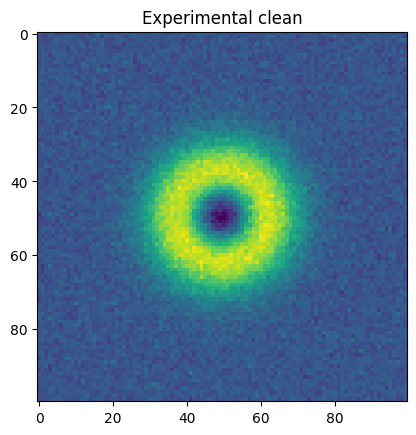

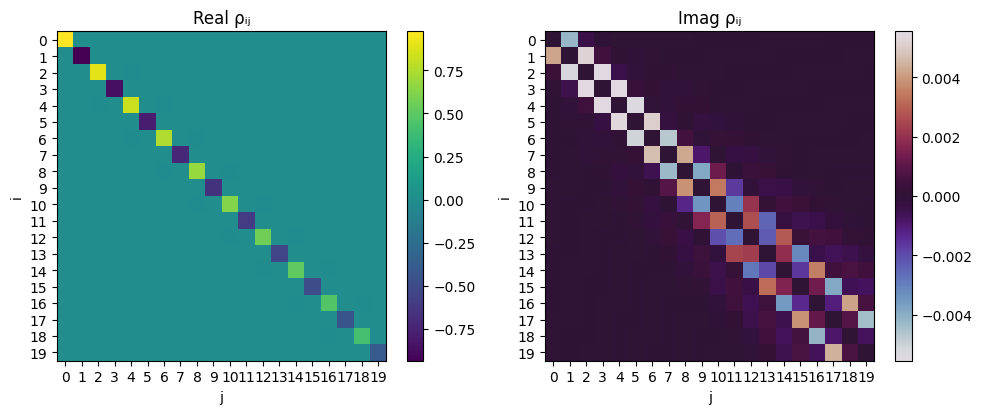

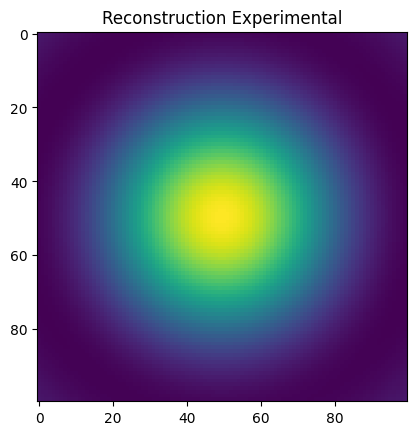

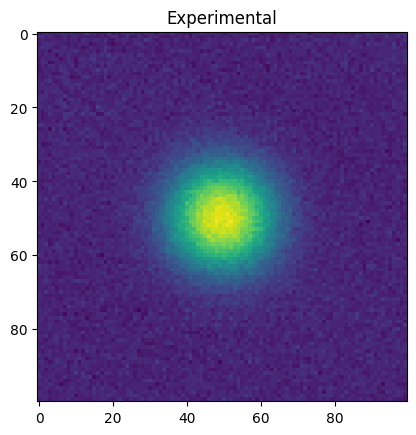

0/20
1/20
2/20
3/20
4/20
5/20
6/20
7/20
8/20
9/20
10/20
11/20
12/20
13/20
14/20
15/20
16/20
17/20
18/20
19/20


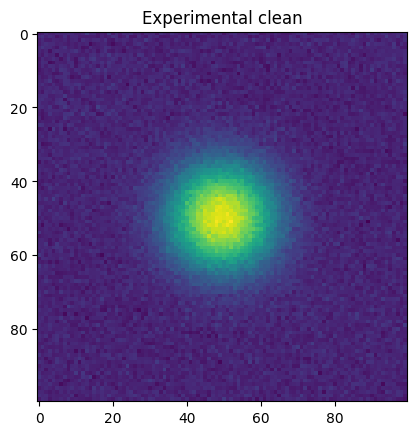

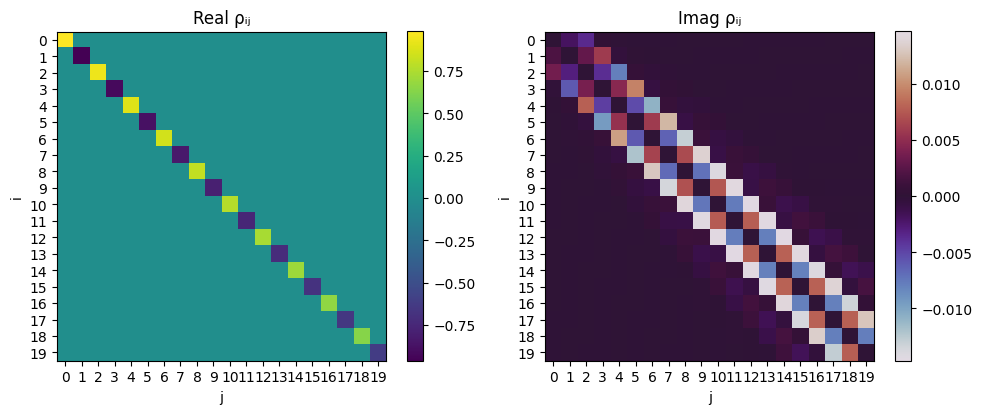

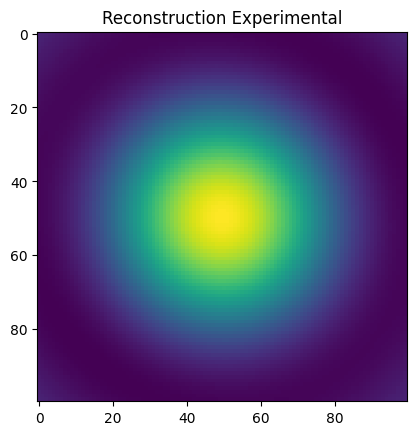

In [57]:
# Compute the density matrix of experiemen wigner


list_of_W_to_reconstruct = []

with open(f'wigner_cat_minus.pickle', 'rb') as f:
    list_of_W_to_reconstruct.append(pickle.load(f))
with open(f'wigner_cat_plus.pickle', 'rb') as f:
    list_of_W_to_reconstruct.append(pickle.load(f))
with open(f'wigner_cat_plus_113.pickle', 'rb') as f:
    list_of_W_to_reconstruct.append(pickle.load(f))
with open(f'wigner_cat_plus_25.pickle', 'rb') as f:
    list_of_W_to_reconstruct.append(pickle.load(f))
with open(f'wigner_cat_plus_56.pickle', 'rb') as f:
    list_of_W_to_reconstruct.append(pickle.load(f))
with open(f'wigner_fock_one.pickle', 'rb') as f:
    list_of_W_to_reconstruct.append(pickle.load(f))
with open(f'wigner_fock_zero.pickle', 'rb') as f:
    list_of_W_to_reconstruct.append(pickle.load(f))


lenx_prev = 0
N = 20
for data in list_of_W_to_reconstruct :

    # Unpack the data
    x = data[0]  # x-axis (position or Re[α])
    y = data[1]  # y-axis (momentum or Im[α])
    z = data[2]  # 2D Wigner function values
    xr = np.array(x) #* np.sqrt(2)
    yr = np.array(y) #* np.sqrt(2)
    W_input = np.array(z)
    W_input = W_input.T

    plt.title(f"Experimental")
    plt.imshow(W_input)
    plt.show()

    dx = xr[1]-xr[0]
    dy = yr[1]-yr[0]


    if len(x) != lenx_prev:
        # do the precomp if we have new data
        l = precomp(N, xr, yr)
    else:
        lenx_prev = len(x)

    a, b = estimate_affine_params(W_input, dx, dy)
    W_input = a * (W_input - b)
    W_input = np.nan_to_num(W_input, nan=0.0)

    plt.title(f"Experimental clean")
    plt.imshow(W_input)
    plt.show()

    r = precomp_reconstr(xr,yr,W_input,N,l)

    plot_density_matrix_ri(r)



    W_reconstruct = wigner(Qobj(r, dims=[[N], [N]]),xr,yr)
    plt.title(f"Reconstruction Experimental")
    plt.imshow(W_reconstruct)
    plt.show()
